In [1]:
from __future__ import print_function
%matplotlib inline
import mdtraj as md
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy
from scipy.spatial.distance import squareform
import pandas as pd
import matplotlib.gridspec as gridspec
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')
import MDAnalysis as mda
from statistics import mode
import ast
import msmexplorer as msme
from msmbuilder.utils import load,dump
import itertools
from msmbuilder.featurizer import ContactFeaturizer
from msmbuilder.featurizer import DihedralFeaturizer
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
import ast
#XRD Ensemble
#28 4NPQ
#18 4HFI

In [2]:
import seaborn as sns
import ptitprince as pt
sns.set(style="whitegrid",font_scale=1)
import matplotlib.collections as clt

In [3]:
import pandas as pd
import MDAnalysis as mda
from MDAnalysis.analysis.hbonds.hbond_analysis import HydrogenBondAnalysis 
from MDAnalysis.analysis.hbonds.wbridge_analysis import WaterBridgeAnalysis 
from joblib import Parallel, delayed
import multiprocessing
num_cores = multiprocessing.cpu_count()

In [4]:
traj_notes = ['4HFI_F238L_pH46_water2','4HFI_F238L_pH46_water3','4HFI_F238L_pH46_water4','4HFI_F238L_pH46_water_test3','4HFI_F238L_pH46_water_test4','4HFI_F238L_pH46_water_test5']
traj_notess = [['4HFI_F238L_pH46_water2','4HFI_F238L_pH46_water3','4HFI_F238L_pH46_water4'],['4HFI_F238L_pH46_water_test3','4HFI_F238L_pH46_water_test4','4HFI_F238L_pH46_water_test5']]

notation_changer = ['4HFI_F238L_pH46_water2','4HFI_F238L_pH46_water_test3']
default_location = '/home/scottzhuang/pdc/'
default_skip = 10

# ANALYSIS# 
## (THERE ARE) NO STUPID QUESTIONS ##

## Dependencies & Software Packages
- __[MDTraj](http://mdtraj.org/1.9.0/)__
- __[MDAanalysis](https://mdanalysis.org)__
- __[CHAP](https://github.com/channotation/chap)__
- __[GetContacts](https://getcontacts.github.io/)__
- __[RainCloudPlots](https://github.com/RainCloudPlots/RainCloudPlots)__
- NumPy, Matplotlib, Pandas, SciPy, MSMBuilder...

## Prerequisite
- Vaildate your simulations visually or with basic gmx tools  
(gmx energy, gmx rms...)
- [Fix periodic boundry condition](http://www.gromacs.org/Documentation/Terminology/Periodic_Boundary_Conditions)

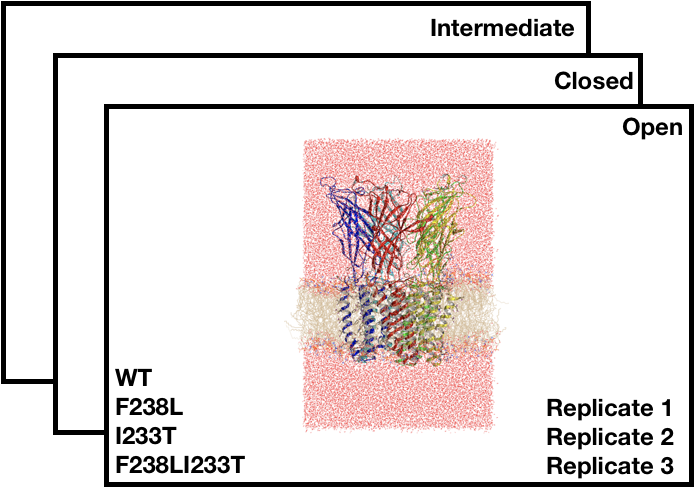  

-> pore hydration

-> helix tilt, twist

-> principal components

-> other gating free energy landscape coordinates  

> * A Protein is a Set Of Coordinates.
        A.P. Heiner

## Data Structure 
- **Pandas**

In [6]:
md_data = pd.read_pickle('../open_glic_intrawater.pickle')

In [7]:
md_data.loc[md_data.MD_name == '4HFI_F238L','replicate'] = md_data.loc[md_data.MD_name == '4HFI_F238L']['replicate'] -2

In [8]:
md_data.head()

,MD_name,pH,replicate,subunit,traj_time,system,rmsd,ecd_rmsd,tmd_rmsd,ecd_pc1,...,intra_water_bridge_263_243,intra_water_bridge_263_239,intra_water_bridge_235_259,intra_hbond_235_259,inter_hbond_230_233,inter_water_bridge_230_233,inter_water_bridge_196_243,inter_hbond_196_243,inter_hbond_196_249,intra_hbond_234_238
1,4HFI,46,1,0,0,0,0.00000,0.000000,0.007192,-0.218533,...,0,0,0,1,0,0,0,0,0,1
2,4HFI,46,1,1,0,0,0.01253,0.000000,0.007192,-0.153843,...,0,0,0,1,0,0,0,0,1,1
3,4HFI,46,1,2,0,0,0.00000,0.008101,0.010171,-0.187962,...,0,0,0,1,0,0,0,0,0,1
4,4HFI,46,1,3,0,0,0.01253,0.011457,0.000000,-0.129403,...,0,0,0,1,0,0,1,0,1,1
5,4HFI,46,1,4,0,0,0.00000,0.000000,0.000000,-0.162889,...,0,0,0,1,0,0,0,0,0,1


## Analysis tools

### Root-mean-square deviation (RMSD) and Root-mean-square fluctuation (RMSF)

In [9]:
def plot_rmsd():
    fig, ax = plt.subplots(figsize=(10, 10))
    sns.lineplot(x='traj_time',y='rmsd',data=md_data[(md_data.system == 0) & (md_data.replicate == 1)],palette='Set2',ax=ax)
    plt.suptitle('RMSD')
    ax.set_ylabel('Å')
    plt.show()

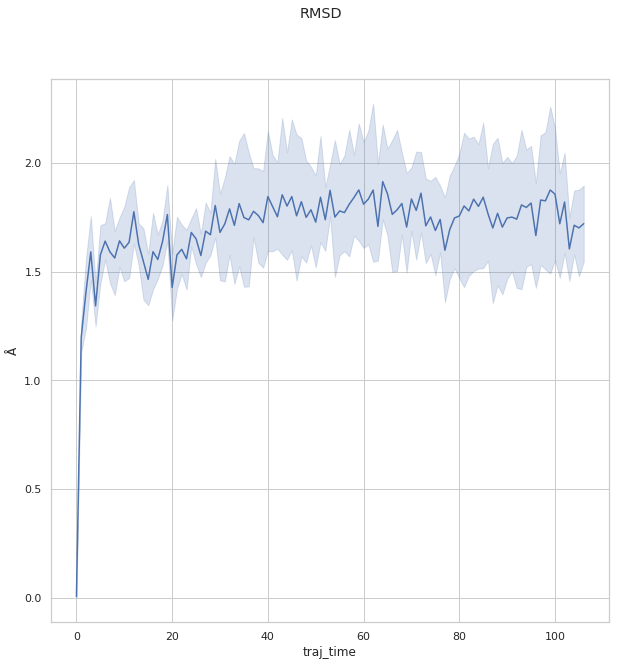

In [10]:
plot_rmsd()

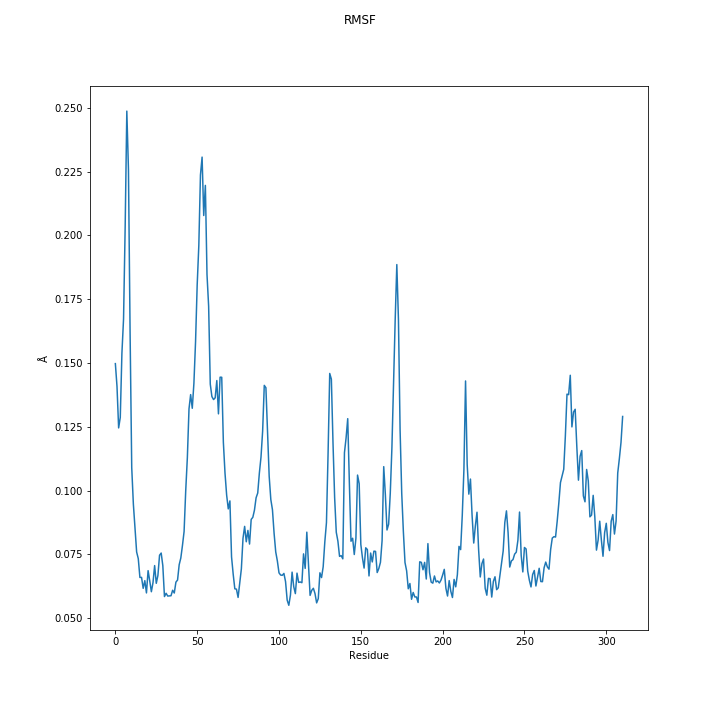

#### Tools
- gmx rms
- gmx rmsf
- MDTraj

```python
traj = md.load(traj_location,top = top_location)
ref_traj = md.load(ref_location)
traj.superpose(ref_traj)
rmsd_data.extend(list(md.rmsd(traj, ref_traj)))
```

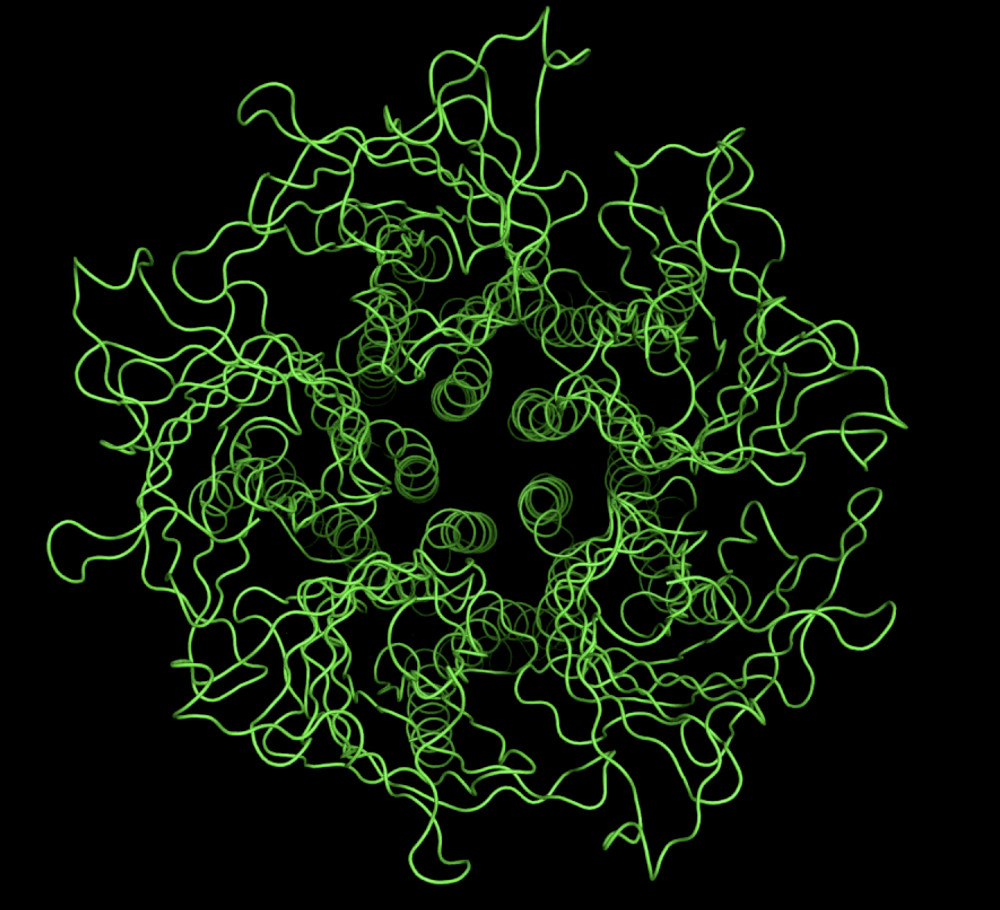

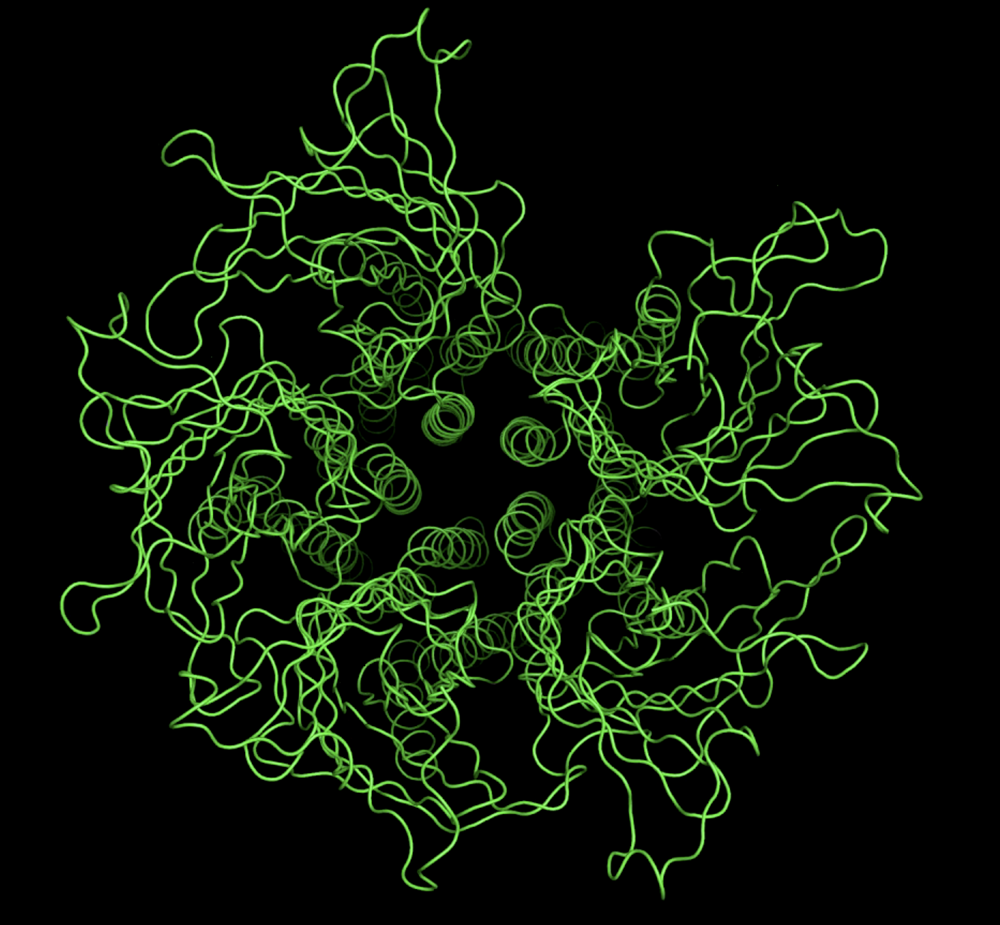

### Geomtric features

* Domain twist
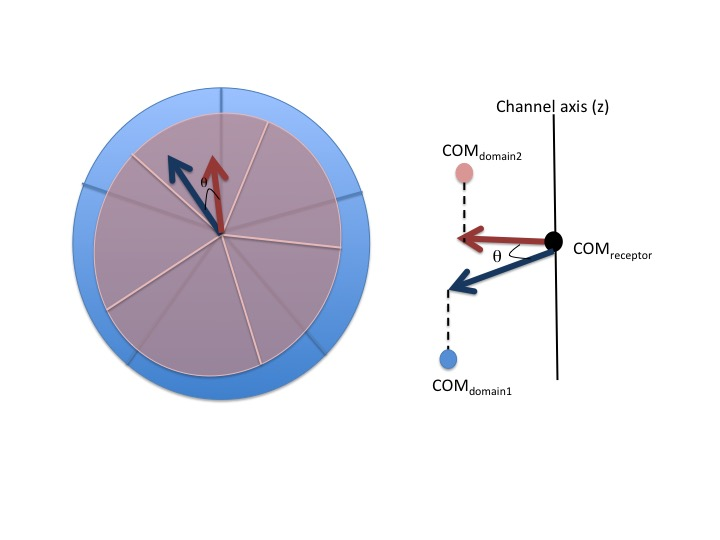

http://stb.proteinart.net/analysis.html

* helix tilt, twist
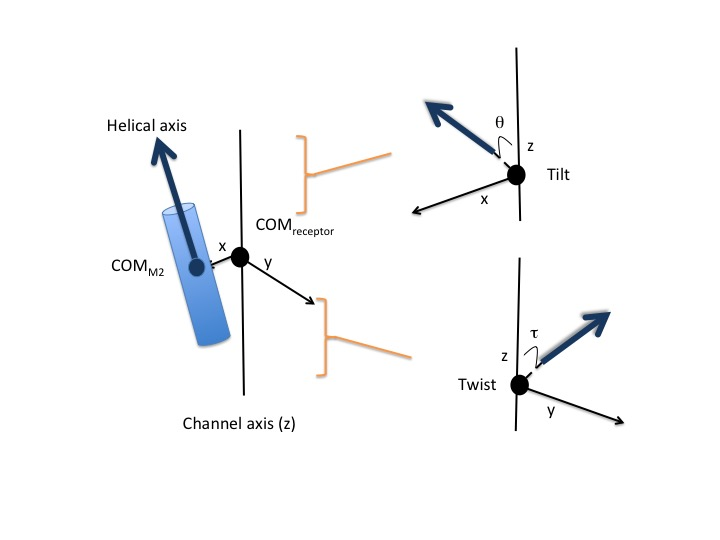

#### Tools
- vmd (tcl scripts)
- MDTraj
    * M1 kink
    
```python
for chain in range(0,5):
    M1_selection_up = 'resid ' + str(195 + chain * 311) + ' to ' + str(199 + chain * 311)
    M1_selection_mid = 'resid ' + str(197 + chain * 311) + ' to ' + str(201 + chain * 311)
    M1_selection_down = 'resid ' + str(200 + chain * 311) + ' to ' + str(211 + chain * 311)

    M1_up = traj.atom_slice(topology.select(M1_selection_up))
    M1_mid = traj.atom_slice(topology.select(M1_selection_mid))
    M1_down = traj.atom_slice(topology.select(M1_selection_down))
    angle.append(angle_calculate(md.compute_center_of_mass(M1_up), 
                                 md.compute_center_of_mass(M1_mid), 
                                 md.compute_center_of_mass(M1_down)))
```

* M1(n) - M2(n+1) distance

```python

subunit_dic = {0:0,1:1,2:2,3:3,4:4,5:0}

for subunit in range(0,5):

    M1_selection = 'resid ' + str(195 + subunit_dic[subunit] * 311) + 
                            ' to ' + str(199 + subunit_dic[subunit] * 311)
    M2_selection = 'resid ' + str(236 + (subunit_dic[subunit+1]) * 311) + 
                            ' to ' + str(240 + (subunit_dic[subunit+1]) * 311)
    traj_M1 = traj.atom_slice(topology.select(M1_selection))
    traj_M2 = traj.atom_slice(topology.select(M2_selection))
    distance.append(distance_cal(md.compute_center_of_mass(traj_M1).T,md.compute_center_of_mass(traj_M2).T))
```

### "Functional" features

* Hydration of pore
* Principal component analysis
* Collective variables

#### Tools
- vmd
- MDAanalysis
    * Pore hydration
```Python
traj = mda.Universe(top_location, traj_location)
hydration = traj.select_atoms("(cyzone 7 8 -8 resid 236) and name OW",updating = True)
for i in range(0,traj.trajectory.n_frames):
    traj.trajectory[i]
    hydration_data.append(hydration.n_atoms)
```

- Chap

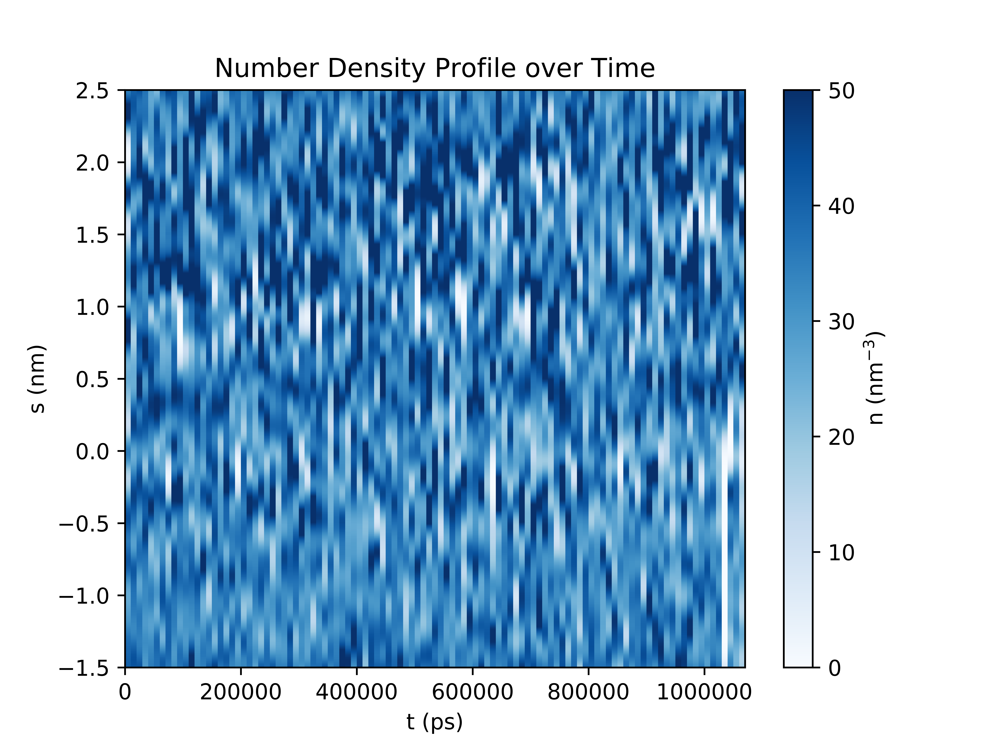

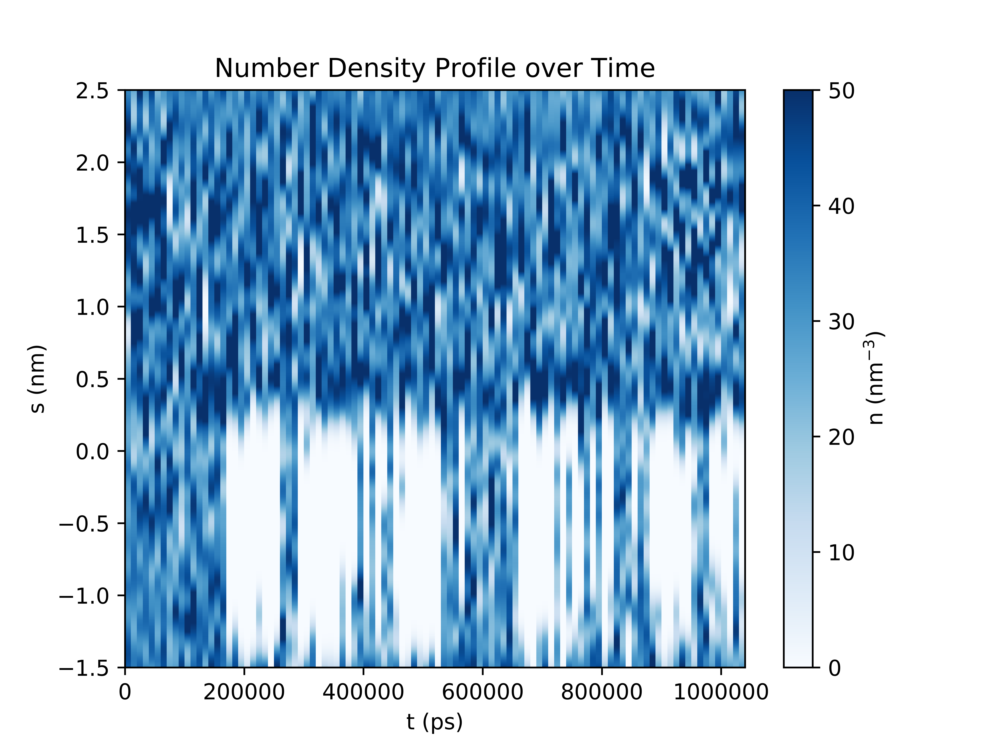

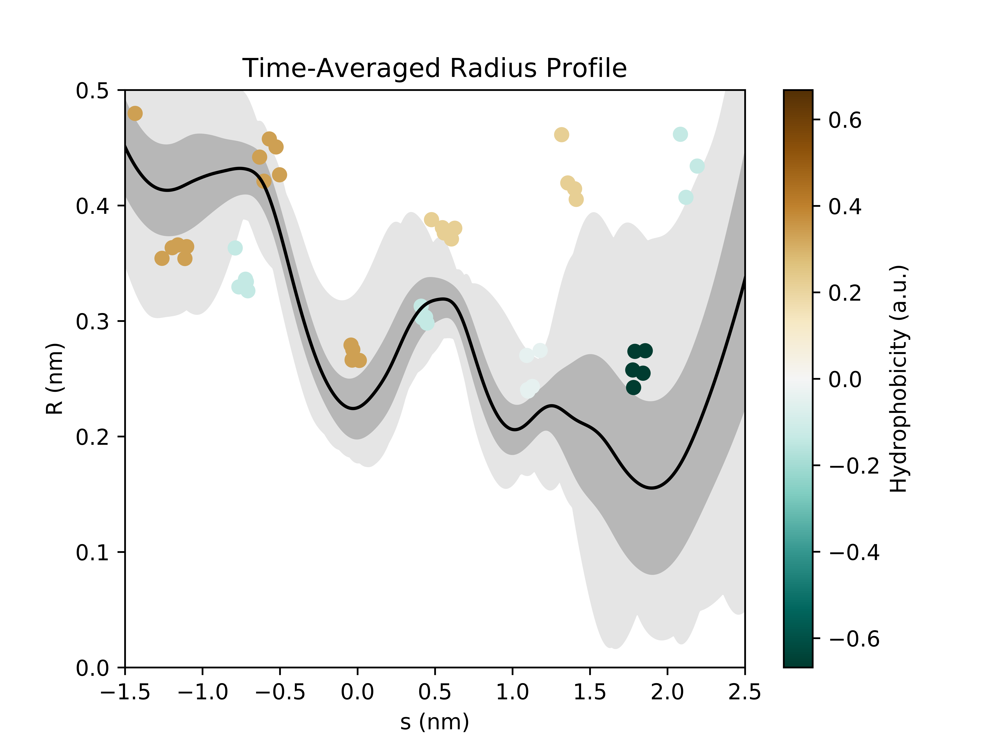

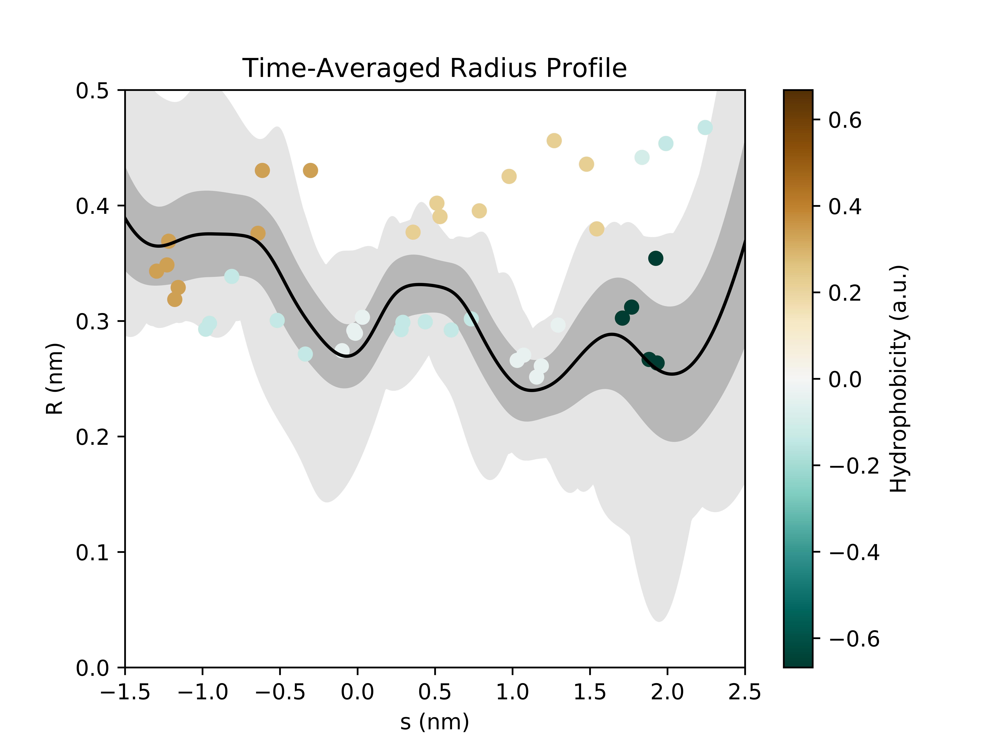

- mdtraj
    * PCA

ecd_pc1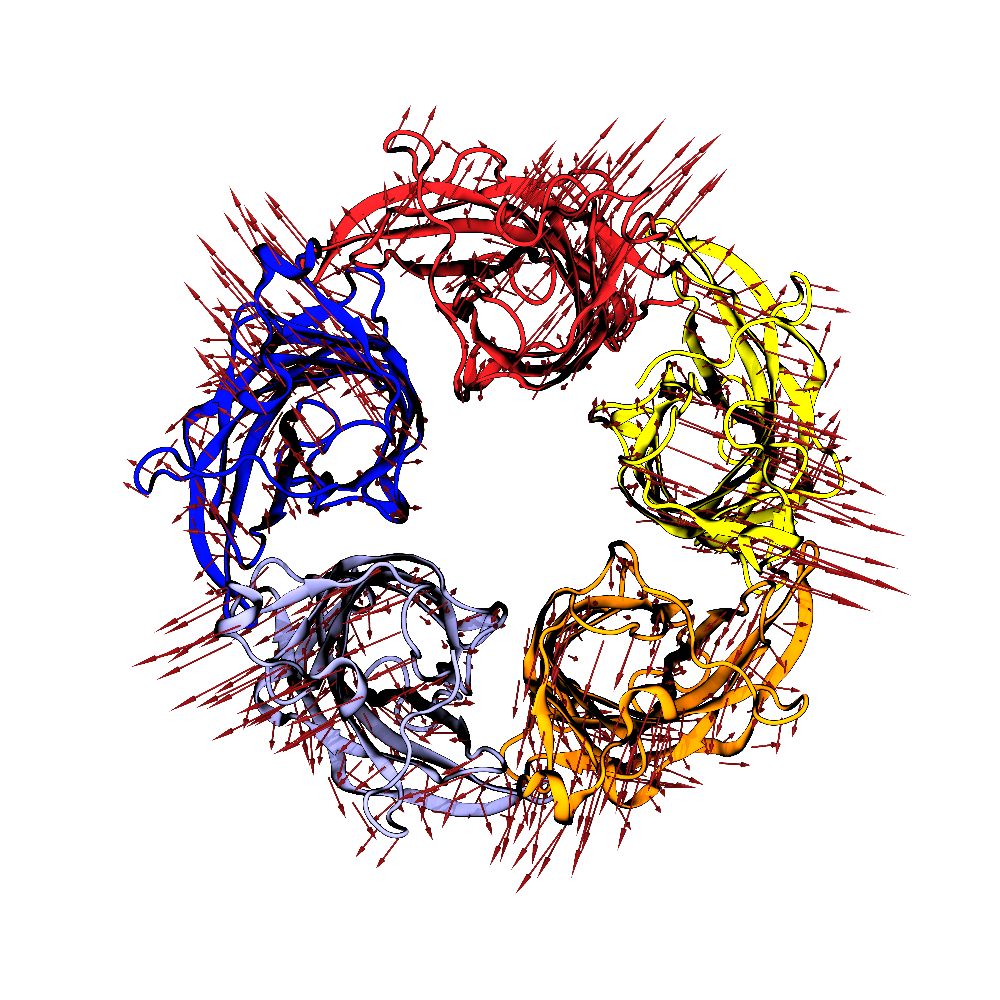

tmd_pc1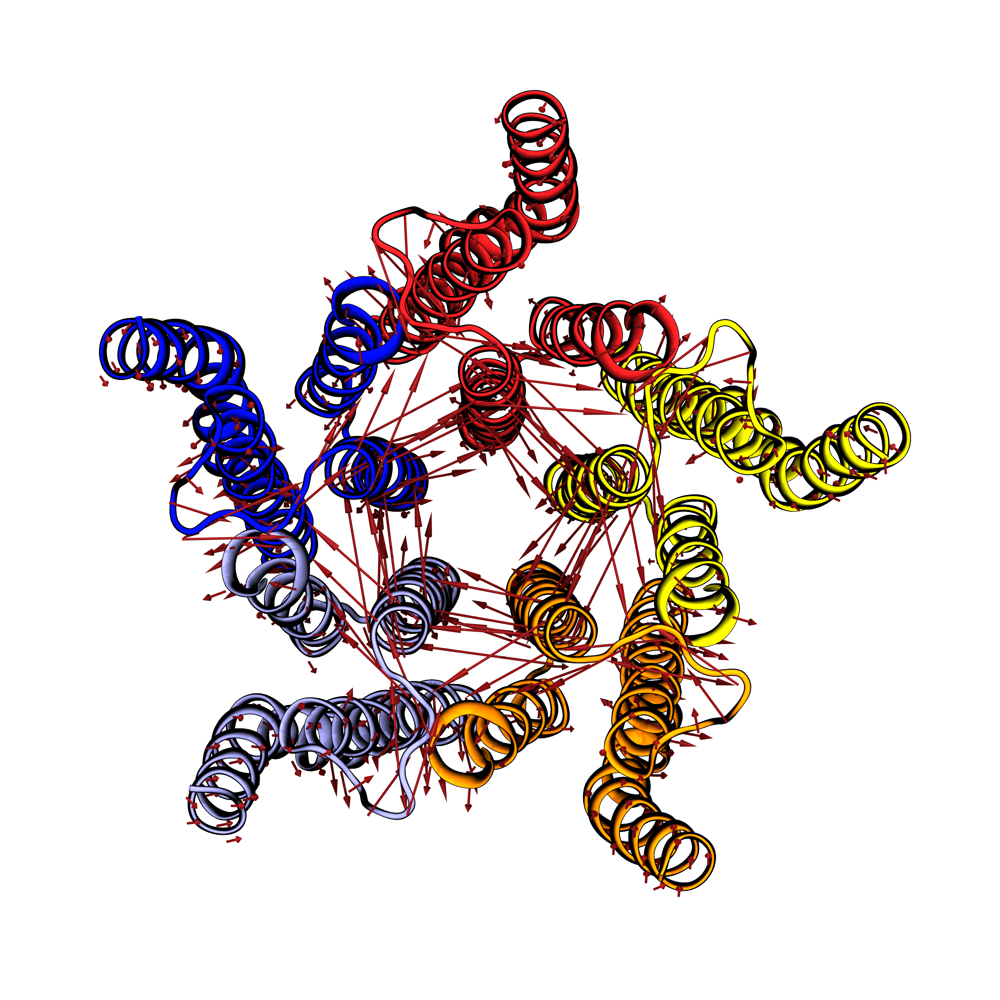

[ 0.67002451  0.20237772]


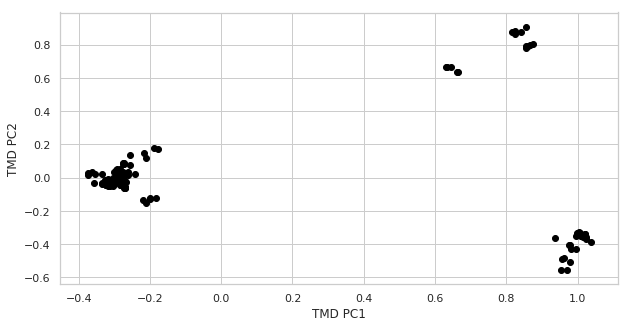

In [11]:
tmd_traj = md.load('/home/scottzhuang/masterthesis/miscellanies/pdb_ensemble/ensemble_subunit_tmd.pdb')
ppca_tmd = PCA(n_components=2)
partial_reduced_cartesian = ppca_tmd.fit_transform(tmd_traj.xyz.reshape(tmd_traj.n_frames, tmd_traj.n_atoms * 3))
print(ppca_tmd.explained_variance_ratio_)
fig, ax = plt.subplots(figsize=(10, 5))
#md_data[(md_data.system == 0)].plot(kind='scatter', x = 'tmd_pc1', y = 'tmd_pc2',ax = ax, c= 'traj_time',colormap='Blues',colorbar=None)
ax.scatter(partial_reduced_cartesian.T[0], partial_reduced_cartesian.T[1],c = 'black')
ax.set_xlabel('TMD PC1')
ax.set_ylabel('TMD PC2')
plt.show()

### "Chem" features

- Electrostatic interactions
- Hydrophobic interactions

[ref](https://getcontacts.github.io/interactions.html)

#### Tools

- MDAanalysis

    * Hbond and water bridge
    
```python
traj = mda.Universe(location + top_location,location + traj_location)
h =  HydrogenBondAnalysis(traj, 'resid 192:315', 'resid 192:315', 
                   selection1_type='donor', distance=3.5, angle=120.0, 
                     distance_type='heavy')
h.run()
h.generate_table()
df = pd.DataFrame.from_records(h.table)
df.to_csv(location + traj_note + "/hbond_tmd.csv")

```

- GetContacts
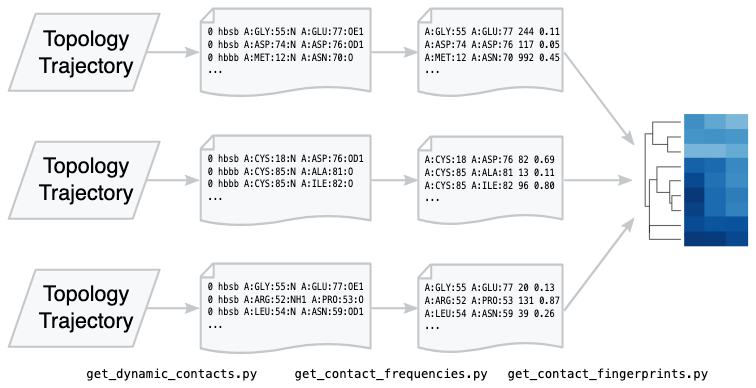

## Visualization

### Line plot

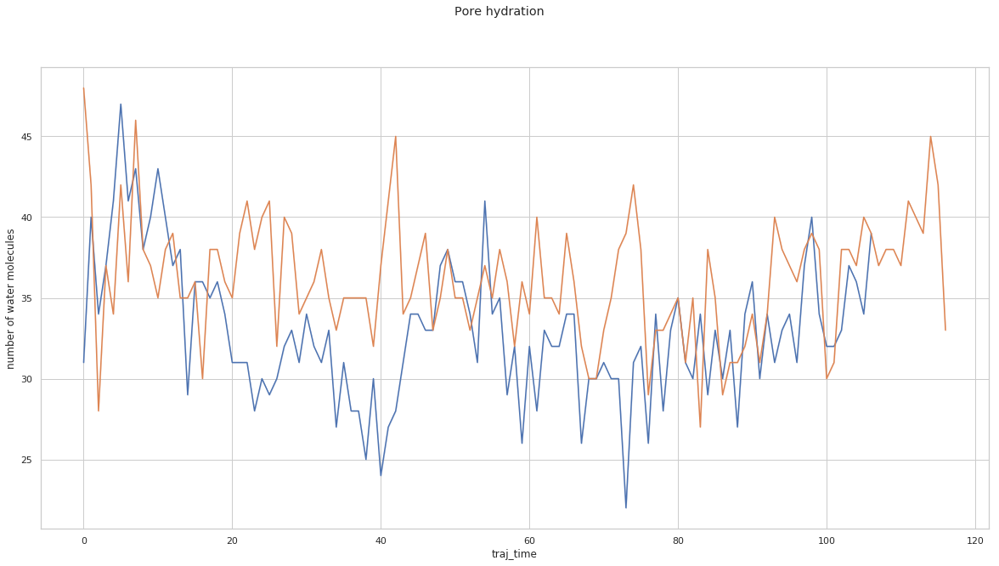

In [12]:
fig, ax = plt.subplots(figsize=(20, 10))
sns.lineplot(x='traj_time',y='pore_hydration',data=md_data[(md_data.system == 0) & (md_data.replicate == 1)],palette='Set2',ax=ax)
sns.lineplot(x='traj_time',y='pore_hydration',data=md_data[(md_data.system == 2) & (md_data.replicate == 1)],palette='Set2',ax=ax)
plt.suptitle('Pore hydration')
ax.set_ylabel('number of water molecules')
plt.show()

### Histogram plot

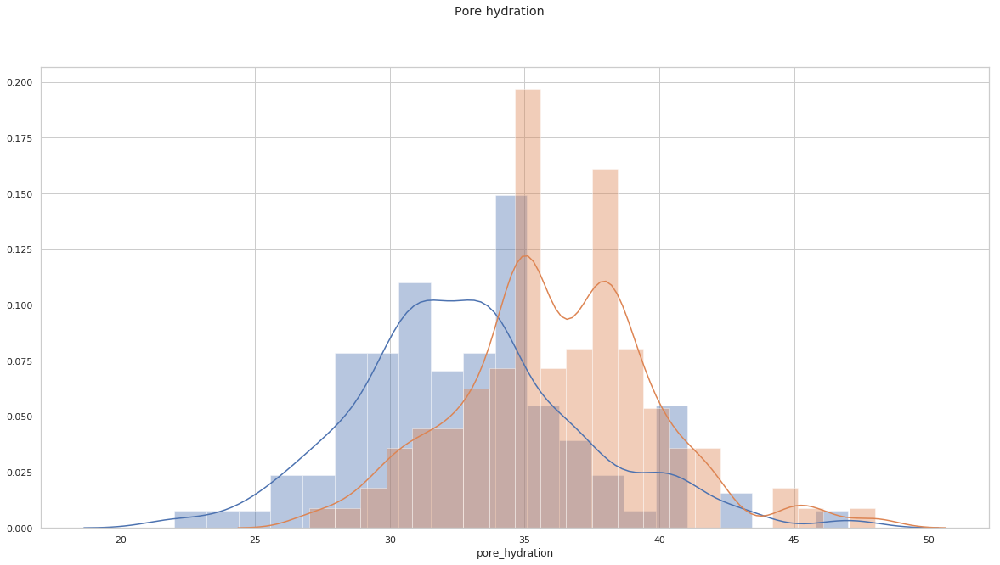

In [13]:
fig, ax = plt.subplots(figsize=(20, 10))
sns.distplot(md_data[(md_data.system == 0) & (md_data.replicate == 1)]['pore_hydration'],ax=ax)
sns.distplot(md_data[(md_data.system == 2) & (md_data.replicate == 1)]['pore_hydration'],ax=ax)
plt.suptitle('Pore hydration')
plt.show()

### Bar plot

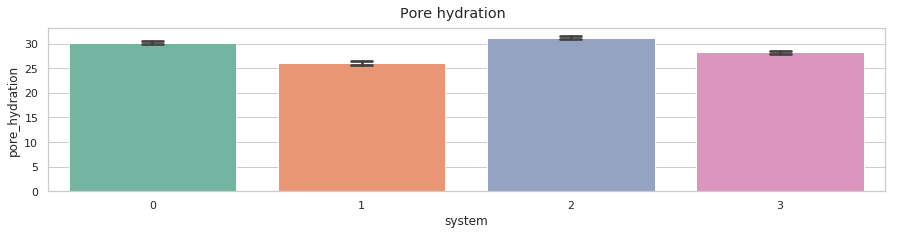

In [14]:
fig, ax = plt.subplots(figsize=(15, 3))
sns.barplot(x='system',y='pore_hydration',data=md_data[(md_data.traj_time > 40)],palette='Set2',capsize=.1,)
#            hue='replicate')
plt.suptitle('Pore hydration')
plt.show()

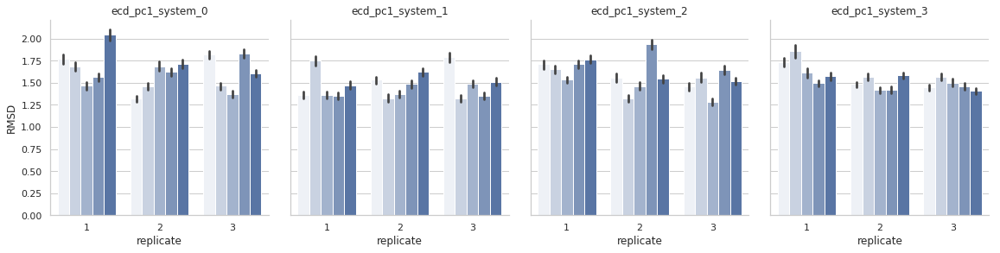

In [15]:
g = sns.FacetGrid(md_data, col = "system", height = 4)
g = g.map_dataframe(sns.barplot, x = "replicate", y = 'rmsd',hue='subunit',data = md_data)
g = g.set_titles('ecd_pc1' + "_system_{col_name}")
g = g.set_axis_labels(x_var='replicate', y_var = 'RMSD')

### Raincloud plot
[ref](https://github.com/RainCloudPlots/RainCloudPlots)

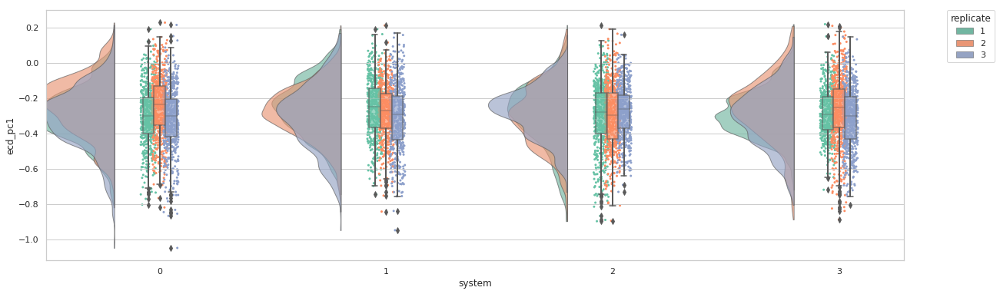

In [17]:
fig, ax = plt.subplots(figsize=(20, 6))
pt.RainCloud(x = 'system', y = 'ecd_pc1', hue='replicate',data = md_data,  
                palette = 'Set2', bw = .2,width_viol = .7,ax=ax,alpha = .65,dodge = True,pointplot=False)
plt.show()

## Miscellaneous

- Å or nm
- ps or ns or μs
- clockwise or anticlockwise
- residue or resSeq or ...
- pdb or gro

colorful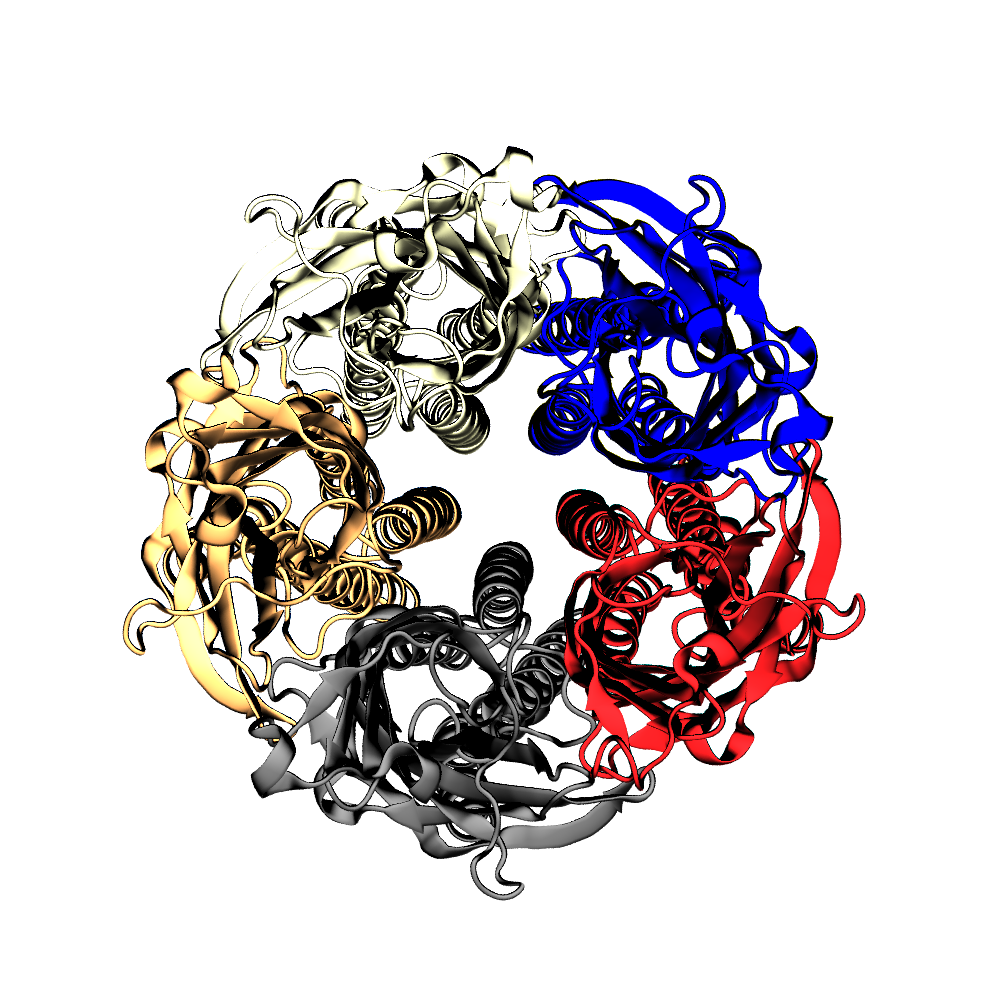

colorless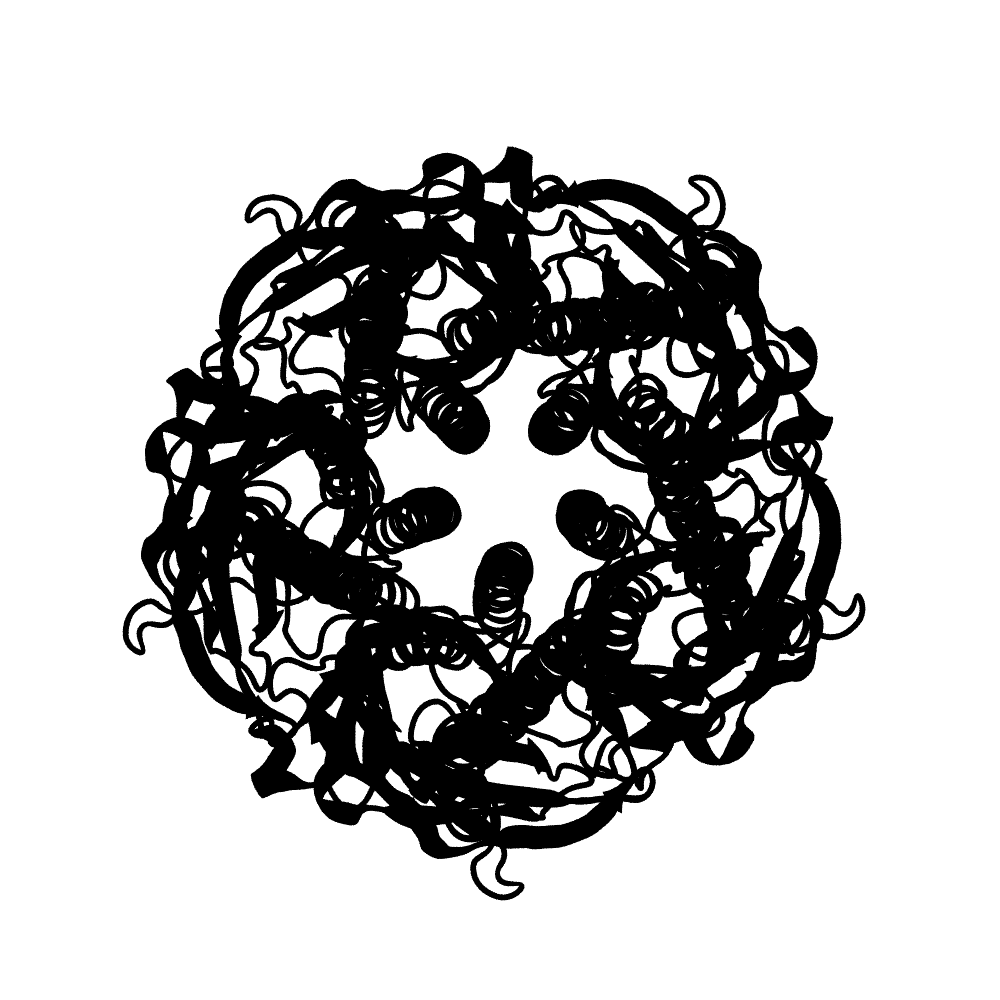

### Other featuralizers/clusterers/modellers
[MSMBuilder](http://msmbuilder.org/3.8.0/)

| Featurizer         | Notes                                          |
|--------------------|------------------------------------------------|
| ContactFeaturizer  | Featurizer based on residue-residue distances. |
| DihedralFeaturizer | Featurizer based on dihedral angles.           |
| ...                | ...                                            |

| Clusterer | Notes                |
|-----------|----------------------|
| KCenters  | K-Centers clustering |
| GMM       | Gaussian Mixture     |
| ...       | ...                  |

- [fpocket2/MDpocket](http://fpocket.sourceforge.net/)
- [scikit-learn](https://scikit-learn.org/)

### Speed up your code
```python
from joblib import Parallel, delayed
import multiprocessing
num_cores = multiprocessing.cpu_count()
Parallel(n_jobs=num_cores-2)(delayed(calculate_H_Bond)(traj) for traj in all_trajs)
```

### Statistics for birdwatchers

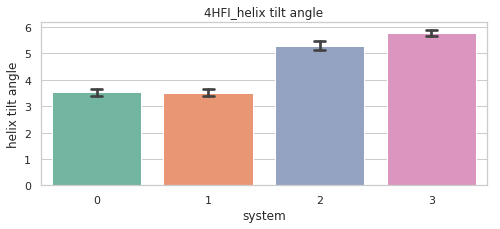

In [18]:
fig, ax = plt.subplots(figsize=(8, 3))
ax.set_title('4HFI_' + 'helix tilt angle')
sns.barplot(x='system',y='helix tilt angle',
            data=md_data[(md_data.traj_time > 30)],
            
            palette='Set2',capsize=.1)
plt.show()

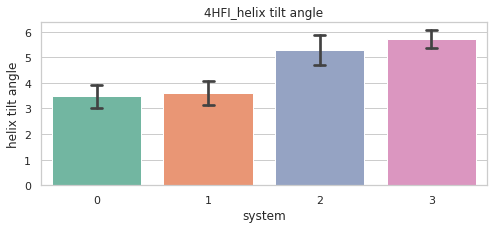

In [19]:
fig, ax = plt.subplots(figsize=(8, 3))
ax.set_title('4HFI_' + 'helix tilt angle')
sns.barplot(x='system',y='helix tilt angle',
            data=md_data[(md_data.traj_time > 30)
            & (md_data.traj_time % 10 == 0)],
            palette='Set2',capsize=.1)
plt.show()

Calculation of standard deviation assumes our snapshots being independent from each other.
- For each property there is a correlation/relaxation time
- This is usually unknown or even the subject of the study

[ref](http://www.courses.physics.helsinki.fi/fys/moldyn/lectures/L6.pdf)

In [ ]:
subunit_dic = {0:0,1:1,2:2,3:3,4:4,5:0,-1:4}

In [ ]:
subunit_dic_mda = {0:'A',1:'B',2:'C',3:'D',4:'E',5:'A'}

In [ ]:
def create_md_dataframe():    
    return pd.DataFrame(columns=list(['MD_name','pH','replicate','subunit','traj_time']))

In [ ]:
md_data = create_md_dataframe()

In [ ]:
def create_metadata(md_data= None):   
    def append_metadata(traj_note, location = default_location, skip = default_skip, md_data = md_data):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top= location + top_location)
        ##Ethanol simulations have a different saving timestep for xtc.
        if traj_note.find('ethanol') >= 0: 
            print("In " + traj_note + ", simulation runs " + str(skip * traj.n_frames / 2 ) + " ns.")
        else:
            print("In " + traj_note + ", simulation runs " + str(skip * traj.n_frames) + " ns.")

        md_name = traj_note[:traj_note.find('pH')-1]
        pH = traj_note[traj_note.find('pH')+2:traj_note.find('pH')+4]
        if traj_note == '4HFI_F238L_pH46_water':
            md_replicate = '1'
        else:
            md_replicate = traj_note[-1]
        for i in range(0,traj.n_frames):
            for subunit in range(0,5):
                md_data.loc[md_data.shape[0]+1] = [md_name,pH,md_replicate,subunit,i]

    for traj_note in traj_notes:
        append_metadata(traj_note)
    md_data['traj_time'] =md_data['traj_time'].apply(int)
    md_data['replicate'] =md_data['replicate'].apply(int)
    md_data['subunit'] =md_data['subunit'].apply(int)


In [ ]:
create_metadata(md_data)

In [ ]:
def create_system_notation(md_data = None):
    system_notation = 0
    notation = -1
    location = default_location
    skip= default_skip

    notations = []
    increment = 0
    for traj_note in traj_notes:
        if traj_note.find('ethanol') >= 0:
            top_location = traj_note + '/' + traj_note + ".ca.gro"
            traj_location = traj_note + '/' + traj_note + ".skip" + str(skip*2) + ".ca.xtc"
        else:
            top_location = traj_note + '/' + traj_note + ".ca.gro"
            traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top= location + top_location)
#        if traj_note.find('md1') >= 0:
#            notation = notation + 1
#        if traj_note.find('md4') >= 0:
#            notation = notation + 1
#       if traj_note.find('md7') >= 0:
#            notation = notation + 1
        if traj_note in notation_changer:
            notation = notation + 1
            

        for frame in range(0,traj.n_frames):
            for subunit in range(0,5):
                notations.append(notation)
        #if increment % 3 == 2:
        #    notation = notation + 1
        #increment = increment + 1 
    md_data['system'] = notations

In [ ]:
create_system_notation(md_data)

In [ ]:
def create_rmsd_data(md_data= None, ref_name = None, select_domain = None):
    def append_rmsd_data(traj_note, subunit, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        residue_selection_1 = "resSeq 13 to 198"
        residue_selection_2 = "resSeq 198 to 316"
        top_location = traj_note + '/' + traj_note + ".ca.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top= location + top_location)
        traj = traj.atom_slice(traj.topology.select('chainid ' + str(subunit)))
        ref_location = location + top_location
        ref_traj = md.load(ref_location)
        ref_traj = ref_traj.atom_slice(ref_traj.topology.select('chainid ' + str(subunit)))
        traj.superpose(ref_traj,0)
        traj_rmsd_data.extend(list(md.rmsd(traj, ref_traj)*10))
    rmsd_data = []
    for traj_note in traj_notes:
        traj_rmsd_data = []

        for subunit in range(0,5):
            append_rmsd_data(traj_note,subunit)
        rmsd_data.extend(list(np.asarray(traj_rmsd_data).reshape(5,int(np.asarray(traj_rmsd_data).shape[0]/5)).T.ravel()))

    md_data['rmsd']= rmsd_data

In [ ]:
create_rmsd_data(md_data)

In [ ]:
def create_ecd_rmsd_data(md_data= None, ref_name = None, select_domain = 'ECD'):
    def append_rmsd_data(traj_note, subunit, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        residue_selection_1 = "resSeq 13 to 198"
        residue_selection_2 = "resSeq 198 to 316"
        top_location = traj_note + '/' + traj_note + ".ca.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top= location + top_location)
        if select_domain == 'TMD':
            traj = traj.atom_slice(traj.topology.select(residue_selection_2))
        elif select_domain == 'ECD':
            traj = traj.atom_slice(traj.topology.select(residue_selection_1))
        traj = traj.atom_slice(traj.topology.select('chainid ' + str(subunit)))
        ref_location = location + top_location
        ref_traj = md.load(ref_location)
        ref_traj = ref_traj.atom_slice(ref_traj.topology.select('chainid ' + str(subunit)))
        if select_domain == 'TMD':
            ref_traj = ref_traj.atom_slice(ref_traj.topology.select(residue_selection_2))
        elif select_domain == 'ECD':
            ref_traj = ref_traj.atom_slice(ref_traj.topology.select(residue_selection_1))
        traj.superpose(ref_traj,0)
        traj_rmsd_data.extend(list(md.rmsd(traj, ref_traj)*10))
    rmsd_data = []
    for traj_note in traj_notes:
        traj_rmsd_data = []

        for subunit in range(0,5):
            append_rmsd_data(traj_note,subunit)
        rmsd_data.extend(list(np.asarray(traj_rmsd_data).reshape(5,int(np.asarray(traj_rmsd_data).shape[0]/5)).T.ravel()))
    if select_domain == 'TMD':
        md_data['tmd_rmsd']= rmsd_data
    elif select_domain == 'ECD':
        md_data['ecd_rmsd']= rmsd_data


In [ ]:
create_ecd_rmsd_data(md_data)

In [ ]:
def create_tmd_rmsd_data(md_data= None, ref_name = None, select_domain = 'TMD'):
    def append_rmsd_data(traj_note, subunit, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        residue_selection_1 = "resSeq 13 to 198"
        residue_selection_2 = "resSeq 198 to 316"
        top_location = traj_note + '/' + traj_note + ".ca.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top= location + top_location)
        if select_domain == 'TMD':
            traj = traj.atom_slice(traj.topology.select(residue_selection_2))
        elif select_domain == 'ECD':
            traj = traj.atom_slice(traj.topology.select(residue_selection_1))
        traj = traj.atom_slice(traj.topology.select('chainid ' + str(subunit)))
        ref_location = location + top_location
        ref_traj = md.load(ref_location)
        ref_traj = ref_traj.atom_slice(ref_traj.topology.select('chainid ' + str(subunit)))
        if select_domain == 'TMD':
            ref_traj = ref_traj.atom_slice(ref_traj.topology.select(residue_selection_2))
        elif select_domain == 'ECD':
            ref_traj = ref_traj.atom_slice(ref_traj.topology.select(residue_selection_1))
        traj.superpose(ref_traj,0)
        traj_rmsd_data.extend(list(md.rmsd(traj, ref_traj)*10))
    rmsd_data = []
    for traj_note in traj_notes:
        traj_rmsd_data = []

        for subunit in range(0,5):
            append_rmsd_data(traj_note,subunit)
        rmsd_data.extend(list(np.asarray(traj_rmsd_data).reshape(5,int(np.asarray(traj_rmsd_data).shape[0]/5)).T.ravel()))
    if select_domain == 'TMD':
        md_data['tmd_rmsd']= rmsd_data
    elif select_domain == 'ECD':
        md_data['ecd_rmsd']= rmsd_data


In [ ]:
create_tmd_rmsd_data(md_data)

In [ ]:
def create_cppca_data(md_data = None): 
    def combined_ppca_reduced_cartesian():
        tmdtraj = md.load('/home/scottzhuang/masterthesis/miscellanies/pdb_ensemble/ensemble_subunit_tmd.pdb')
        ecdtraj = md.load('/home/scottzhuang/masterthesis/miscellanies/pdb_ensemble/ensemble_subunit_ecd.pdb')
        ppca_ecd = PCA(n_components=2)
        ppca_tmd = PCA(n_components=2)
        partial_reduced_cartesian = [ppca_ecd.fit_transform(ecdtraj.xyz.reshape(ecdtraj.n_frames, ecdtraj.n_atoms * 3)), ppca_tmd.fit_transform(tmdtraj.xyz.reshape(tmdtraj.n_frames, tmdtraj.n_atoms * 3))]    
        print(ppca_ecd.explained_variance_ratio_)
        print(ppca_tmd.explained_variance_ratio_)
        return partial_reduced_cartesian, ecdtraj, tmdtraj,ppca_ecd,ppca_tmd

    def append_projection_on_combined_ppca_data(traj_note, subunit, location = default_location, skip = default_skip, residue_selection_1 = "resSeq 8 to 192", residue_selection_2 = "resSeq 192 to 315"):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".ca.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top= location + top_location)
        topology = traj.topology
        traj_sliced_ecd = traj.atom_slice(topology.select(residue_selection_1 + 'and chainid ' + str(subunit) ))
        traj_sliced_tmd = traj.atom_slice(topology.select(residue_selection_2 + 'and chainid ' + str(subunit) ))

        traj_sliced_ecd.superpose(wholetraj_sliced_ecd,0)
        traj_sliced_tmd.superpose(wholetraj_sliced_tmd,0)

        reduced_cartesian_ecd_pc1.extend(ppca_ecd.transform(traj_sliced_ecd.xyz.reshape(traj_sliced_ecd.n_frames, traj_sliced_ecd.n_atoms * 3)).T[0])
        reduced_cartesian_ecd_pc2.extend(ppca_ecd.transform(traj_sliced_ecd.xyz.reshape(traj_sliced_ecd.n_frames, traj_sliced_ecd.n_atoms * 3)).T[1])
        reduced_cartesian_tmd_pc1.extend(ppca_tmd.transform(traj_sliced_tmd.xyz.reshape(traj_sliced_tmd.n_frames, traj_sliced_tmd.n_atoms * 3)).T[0])
        reduced_cartesian_tmd_pc2.extend(ppca_tmd.transform(traj_sliced_tmd.xyz.reshape(traj_sliced_tmd.n_frames, traj_sliced_tmd.n_atoms * 3)).T[1])
     
    final_ecd_pc1 =[]
    final_ecd_pc2 =[]
    final_tmd_pc1 =[]
    final_tmd_pc2 =[]


    partial_reduced_cartesian, wholetraj_sliced_ecd,wholetraj_sliced_tmd, ppca_ecd,ppca_tmd = combined_ppca_reduced_cartesian()

    for traj_note in traj_notes:
        reduced_cartesian_ecd_pc1 = []
        reduced_cartesian_ecd_pc2 = []
        reduced_cartesian_tmd_pc1 = []
        reduced_cartesian_tmd_pc2 = []
        for subunit in range(0,5):
            append_projection_on_combined_ppca_data(traj_note,subunit)
        final_ecd_pc1.extend(np.asarray(reduced_cartesian_ecd_pc1).reshape(5,int(np.asarray(reduced_cartesian_ecd_pc1).shape[0]/5)).T.ravel())
        final_ecd_pc2.extend(np.asarray(reduced_cartesian_ecd_pc2).reshape(5,int(np.asarray(reduced_cartesian_ecd_pc2).shape[0]/5)).T.ravel())
        final_tmd_pc1.extend(np.asarray(reduced_cartesian_tmd_pc1).reshape(5,int(np.asarray(reduced_cartesian_tmd_pc1).shape[0]/5)).T.ravel())
        final_tmd_pc2.extend(np.asarray(reduced_cartesian_tmd_pc2).reshape(5,int(np.asarray(reduced_cartesian_tmd_pc2).shape[0]/5)).T.ravel())

    md_data['ecd_pc1']= final_ecd_pc1
    md_data['ecd_pc2']= final_ecd_pc2
    md_data['tmd_pc1']= final_tmd_pc1
    md_data['tmd_pc2']= final_tmd_pc2

In [ ]:
create_cppca_data(md_data)

In [ ]:
def create_helix_tilt_data(md_data = None):
    def append_helix_tilt_data(traj_note,subunit, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        tilt_data = pd.read_csv(location + traj_note + '/analysis/' + traj_note + '.tilt.csv',sep=" ")
        tilt_data.columns = ['traj_time','avg','ang1','ang2','ang3','ang4','ang5']
        traj_helix_tilt_data.extend(tilt_data['ang' + str(subunit+1)])

    helix_tilt_data = []
    for traj_note in traj_notes:
        traj_helix_tilt_data = []
        for subunit in range(0,5):
            append_helix_tilt_data(traj_note,subunit)
        helix_tilt_data.extend(list(np.asarray(traj_helix_tilt_data).reshape(5,int(np.asarray(traj_helix_tilt_data).shape[0]/5)).T.ravel()))

    md_data['helix tilt angle'] = helix_tilt_data

In [ ]:
create_helix_tilt_data(md_data)

In [ ]:
def create_helix_twist_data(md_data = None):
    def append_helix_twist_data(traj_note,subunit, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        twist_data = pd.read_csv(location + traj_note + '/analysis/' + traj_note + '.twist.csv',sep=" ")
        twist_data.columns = ['traj_time','avg','ang1','ang2','ang3','ang4','ang5']
        traj_helix_twist_data.extend(twist_data['ang' + str(subunit+1)])
        
    helix_twist_data = []
    for traj_note in traj_notes:
        traj_helix_twist_data = []

        for subunit in range(0,5):
            append_helix_twist_data(traj_note,subunit)
        helix_twist_data.extend(list(np.asarray(traj_helix_twist_data).reshape(5,int(np.asarray(traj_helix_twist_data).shape[0]/5)).T.ravel()))

    md_data['helix twist angle'] = helix_twist_data

In [ ]:
create_helix_twist_data(md_data)

In [ ]:
def create_M1_kink(md_data = None):
    def angle_calculate(x,y,z):
        angle_set = []
        for i in range(0,x.shape[0]):
            angle_set.append(np.degrees(np.arccos(np.dot((y[i]-x[i]),(y[i]-z[i]))/(np.linalg.norm(y[i]-x[i]) * np.linalg.norm(y[i]-z[i])))))
        return angle_set
    def append_M1_kink_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top = location + top_location)
        topology = traj.topology
        angle = []
        for chain in range(0,5):
            M1_selection_up = 'resid ' + str(195 + chain * 311) + ' to ' + str(199 + chain * 311)
            M1_selection_mid = 'resid ' + str(197 + chain * 311) + ' to ' + str(201 + chain * 311)
            M1_selection_down = 'resid ' + str(200 + chain * 311) + ' to ' + str(211 + chain * 311)

            M1_up = traj.atom_slice(topology.select(M1_selection_up))
            M1_mid = traj.atom_slice(topology.select(M1_selection_mid))
            M1_down = traj.atom_slice(topology.select(M1_selection_down))
            angle.append(angle_calculate(md.compute_center_of_mass(M1_up), md.compute_center_of_mass(M1_mid), md.compute_center_of_mass(M1_down)))
        M1_kink.extend(np.asarray(angle).T.ravel())
    M1_kink = []
    for traj_note in traj_notes:
        append_M1_kink_data(traj_note)
    md_data['M1_kink'] = M1_kink


In [ ]:
create_M1_kink(md_data)

In [ ]:
def create_M1_upper_kink(md_data = None):
    def angle_calculate(x,y,z):
        angle_set = []
        for i in range(0,x.shape[0]):
            angle_set.append(np.degrees(np.arccos(np.dot((y[i]-x[i]),(y[i]-z[i]))/(np.linalg.norm(y[i]-x[i]) * np.linalg.norm(y[i]-z[i])))))
        return angle_set
    def append_M1_kink_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top = location + top_location)
        topology = traj.topology
        angle = []
        for chain in range(0,5):
            M1_selection_up = 'resid ' + str(191 + chain * 311) + ' to ' + str(195 + chain * 311)
            M1_selection_mid = 'resid ' + str(195 + chain * 311) + ' to ' + str(196 + chain * 311)
            M1_selection_down = 'resid ' + str(196 + chain * 311) + ' to ' + str(200 + chain * 311)

            M1_up = traj.atom_slice(topology.select(M1_selection_up))
            M1_mid = traj.atom_slice(topology.select(M1_selection_mid))
            M1_down = traj.atom_slice(topology.select(M1_selection_down))
            angle.append(angle_calculate(md.compute_center_of_mass(M1_up), md.compute_center_of_mass(M1_mid), md.compute_center_of_mass(M1_down)))
        M1_kink.extend(np.asarray(angle).T.ravel())
    M1_kink = []
    for traj_note in traj_notes:
        append_M1_kink_data(traj_note)
    md_data['M1_upper_kink'] = M1_kink


In [ ]:
create_M1_upper_kink(md_data)

In [ ]:
def create_M2_kink(md_data = None):
    def angle_calculate(x,y,z):
        angle_set = []
        for i in range(0,x.shape[0]):
            angle_set.append(np.degrees(np.arccos(np.dot((y[i]-x[i]),(y[i]-z[i]))/(np.linalg.norm(y[i]-x[i]) * np.linalg.norm(y[i]-z[i])))))
        return angle_set
    def append_M2_kink_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top = location + top_location)
        topology = traj.topology
        angle = []
        for chain in range(0,5):
            M2_selection_up = 'resid ' + str(216 + chain * 311) + ' to ' + str(233 + chain * 311)
            M2_selection_mid = 'resid ' + str(233 + chain * 311) + ' to ' + str(233 + chain * 311)
            M2_selection_down = 'resid ' + str(233 + chain * 311) + ' to ' + str(240 + chain * 311)

            M2_up = traj.atom_slice(topology.select(M2_selection_up))
            M2_mid = traj.atom_slice(topology.select(M2_selection_mid))
            M2_down = traj.atom_slice(topology.select(M2_selection_down))
            angle.append(angle_calculate(md.compute_center_of_mass(M2_up), md.compute_center_of_mass(M2_mid), md.compute_center_of_mass(M2_down)))
        M2_kink.extend(np.asarray(angle).T.ravel())
    M2_kink = []
    for traj_note in traj_notes:
        append_M2_kink_data(traj_note)
    md_data['M2_kink'] = M2_kink


In [ ]:
create_M2_kink(md_data)

In [ ]:
def create_hydration_profile(md_data = None):
    def append_hydration_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
            top_location = traj_note + '/' + traj_note + ".system.gro"
            traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
            traj = mda.Universe(location + top_location,location + traj_location)
        else:
            top_location = traj_note + '/' + traj_note + ".system.gro"
            traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
            traj = mda.Universe(location + top_location,location + traj_location)
        hydration = traj.select_atoms("(cyzone 7 8 -8 resid 236) and name OW",updating = True)
        for i in range(0,traj.trajectory.n_frames):
            traj.trajectory[i]
            for j in range(0,5):
                hydration_data.append(hydration.n_atoms)
    hydration_data = []
    for traj_note in traj_notes:
        append_hydration_data(traj_note)
    md_data['pore_hydration'] = hydration_data

In [ ]:
create_hydration_profile(md_data)

In [ ]:
def create_ethanol_profile(md_data = None):
    def append_ethanol_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
            top_location = traj_note + '/' + traj_note + ".system.gro"
            traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
            traj = mda.Universe(location + top_location,location + traj_location)
        else:
            top_location = traj_note + '/' + traj_note + ".system.gro"
            traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
            traj = mda.Universe(location + top_location,location + traj_location)
        ethanol = traj.select_atoms("(cyzone 7 10 -10 resid 235) and resname LIG",updating = True)
        for i in range(0,traj.trajectory.n_frames):
            traj.trajectory[i]
            for j in range(0,5):

                ethanol_data.append(np.ceil(ethanol.n_atoms / 9))
    ethanol_data = []
    for traj_note in traj_notes:
        append_ethanol_data(traj_note)
    md_data['pore_ethanol'] = ethanol_data

In [ ]:
create_ethanol_profile(md_data)

In [ ]:
def create_M2_n_M1_m_distance(md_data = None):
    def distance_calculate(x,y):
        dist = np.sqrt(np.power(x[0]-y[0],2) + np.power(x[1]-y[1],2) + np.power(x[2]-y[2],2))
        return dist
    def append_M2_M1_distance_data(traj_note,subunit,location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top = location + top_location)
        topology = traj.topology
        distance = []
        M1_selection = 'resid ' + str(195 + subunit_dic[subunit] * 311) + ' to ' + str(199 + subunit_dic[subunit] * 311)
        M2_selection = 'resid ' + str(236 + (subunit_dic[subunit+1]) * 311) + ' to ' + str(240 + (subunit_dic[subunit+1]) * 311)
        traj_M1 = traj.atom_slice(topology.select(M1_selection))
        traj_M2 = traj.atom_slice(topology.select(M2_selection))
        distance.append(distance_calculate(md.compute_center_of_mass(traj_M1).T,md.compute_center_of_mass(traj_M2).T))
        traj_M2_M1_distance.extend(distance[0])

    M2_M1_distance = []

    for traj_note in traj_notes:
        traj_M2_M1_distance = []
        for subunit in range(0,5):
            append_M2_M1_distance_data(traj_note,subunit)
            
        M2_M1_distance.extend(list(np.asarray(traj_M2_M1_distance).reshape(5,int(np.asarray(traj_M2_M1_distance).shape[0]/5)).T.ravel()))

    md_data['M1(n)_M2(n+1)_distance'] = M2_M1_distance


In [ ]:
create_M2_n_M1_m_distance(md_data)

In [ ]:
def create_M2_n_M1_n_distance(md_data = None):
    def distance_calculate(x,y):
        dist = np.sqrt(np.power(x[0]-y[0],2) + np.power(x[1]-y[1],2) + np.power(x[2]-y[2],2))
        return dist
    def append_M2_M1_distance_data(traj_note,subunit,location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top = location + top_location)
        topology = traj.topology
        distance = []
        M1_selection = 'resid ' + str(195 + subunit_dic[subunit] * 311) + ' to ' + str(199 + subunit_dic[subunit] * 311)
        M2_selection = 'resid ' + str(236 + (subunit_dic[subunit]) * 311) + ' to ' + str(240 + (subunit_dic[subunit]) * 311)
        traj_M1 = traj.atom_slice(topology.select(M1_selection))
        traj_M2 = traj.atom_slice(topology.select(M2_selection))
        distance.append(distance_calculate(md.compute_center_of_mass(traj_M1).T,md.compute_center_of_mass(traj_M2).T))
        traj_M2_M1_distance.extend(distance[0])

    M2_M1_distance = []

    for traj_note in traj_notes:
        traj_M2_M1_distance = []
        for subunit in range(0,5):
            append_M2_M1_distance_data(traj_note,subunit)
            
        M2_M1_distance.extend(list(np.asarray(traj_M2_M1_distance).reshape(5,int(np.asarray(traj_M2_M1_distance).shape[0]/5)).T.ravel()))

    md_data['M1(n)_M2(n)_distance'] = M2_M1_distance


In [ ]:
create_M2_n_M1_n_distance(md_data)

In [ ]:
def create_beta_expansion(md_data = None):
    def append_beta_expansion_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".ca.xtc"
        traj = md.load(location + traj_location,top = location + top_location)
        distance = []
        for chain in range(0,5):
            distance.append(md.compute_distances(traj,[[27 + chain * 311,187 + chain * 311]]))
        beta_expansion_data.extend(np.asarray(distance).T.ravel())
    beta_expansion_data = []
    for traj_note in traj_notes:
        append_beta_expansion_data(traj_note)
    md_data['beta_expansion'] = beta_expansion_data

In [ ]:
create_beta_expansion(md_data)

In [ ]:
def create_pore_resid_angle(md_data = None):
    subunit_dic_2 = {0:'0',1:'1',2:'2',3:'3',4:'4',5:'0',-1:'4'}
    def angle_between_vectors_degrees(a, b, c):
        angle_set = []
        for i in range(0,a.shape[0]):
            u = b[i][:2] - a[i][:2]
            v = b[i][:2] - c[i][:2]
            angle_set.append(np.degrees(
                np.arccos(np.dot(u, v) / (np.linalg.norm(u) * np.linalg.norm(v)))))
        return angle_set
    def compute_pore_resid_angle(traj_note,resid,location = default_location, skip = default_skip):
        top_location = traj_note + '/' + traj_note + ".protein.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".protein.xtc"
        traj = md.load(location + traj_location,top = location + top_location)
        topology = traj.topology
        angle = []
        for chain in range(0,5):
            backbone_COM_0 = md.compute_center_of_mass(traj.atom_slice(topology.select('resSeq ' + str(resid) +  ' and backbone and chainid ' + subunit_dic_2[chain-1])))
            backbone_COM_1 = md.compute_center_of_mass(traj.atom_slice(topology.select('resSeq ' + str(resid) +  ' and backbone and chainid ' + subunit_dic_2[chain])))
            backbone_COM_2 = md.compute_center_of_mass(traj.atom_slice(topology.select('resSeq ' + str(resid) +  ' and backbone and chainid ' + subunit_dic_2[chain+1])))
            sidechain_COM_1 = md.compute_center_of_mass(traj.atom_slice(topology.select('resSeq ' + str(resid) +  ' and name CB and chainid ' + subunit_dic_2[chain])))
            sidechain_angle = angle_between_vectors_degrees(sidechain_COM_1,backbone_COM_1,backbone_COM_2)
            helix_angle = angle_between_vectors_degrees(backbone_COM_0,backbone_COM_1,backbone_COM_2)
            angle.append(list(map(lambda x:(x[0] if x[0]>x[1]/2 else x[0]+x[1]/2),np.asarray([sidechain_angle,helix_angle]).T)))
        pore_angle.extend(np.asarray(angle).T.ravel())
    pore_angle = []

    for traj_note in traj_notes:
        compute_pore_resid_angle(traj_note,233)
    md_data['pore_233_angle'] = pore_angle


In [ ]:
def create_pore_resid240_angle(md_data = None):
    subunit_dic_2 = {0:'0',1:'1',2:'2',3:'3',4:'4',5:'0',-1:'4'}
    def angle_between_vectors_degrees(a, b, c):
        angle_set = []
        for i in range(0,a.shape[0]):
            u = b[i][:2] - a[i][:2]
            v = b[i][:2] - c[i][:2]
            angle_set.append(np.degrees(
                np.arccos(np.dot(u, v) / (np.linalg.norm(u) * np.linalg.norm(v)))))
        return angle_set
    def compute_pore_resid_angle(traj_note,resid,location = default_location, skip = default_skip):
        top_location = traj_note + '/' + traj_note + ".protein.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".protein.xtc"
        traj = md.load(location + traj_location,top = location + top_location)
        topology = traj.topology
        angle = []
        for chain in range(0,5):
            backbone_COM_0 = md.compute_center_of_mass(traj.atom_slice(topology.select('resSeq ' + str(resid) +  ' and backbone and chainid ' + subunit_dic_2[chain-1])))
            backbone_COM_1 = md.compute_center_of_mass(traj.atom_slice(topology.select('resSeq ' + str(resid) +  ' and backbone and chainid ' + subunit_dic_2[chain])))
            backbone_COM_2 = md.compute_center_of_mass(traj.atom_slice(topology.select('resSeq ' + str(resid) +  ' and backbone and chainid ' + subunit_dic_2[chain+1])))
            sidechain_COM_1 = md.compute_center_of_mass(traj.atom_slice(topology.select('resSeq ' + str(resid) +  ' and name CB and chainid ' + subunit_dic_2[chain])))
            sidechain_angle = angle_between_vectors_degrees(sidechain_COM_1,backbone_COM_1,backbone_COM_2)
            helix_angle = angle_between_vectors_degrees(backbone_COM_0,backbone_COM_1,backbone_COM_2)
            angle.append(list(map(lambda x:(x[0] if x[0]>x[1]/2 else x[0]+x[1]/2),np.asarray([sidechain_angle,helix_angle]).T)))
        pore_angle.extend(np.asarray(angle).T.ravel())
    pore_angle = []

    for traj_note in traj_notes:
        compute_pore_resid_angle(traj_note,240)
    md_data['pore_240_angle'] = pore_angle


In [ ]:
create_pore_resid_angle(md_data)

In [ ]:
create_pore_resid240_angle(md_data)

In [ ]:
def create_intersubunit_hydration_data(md_data = None):
    def create_intersubunit_hydration_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('hydration') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".system.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
        traj = mda.Universe(default_location + top_location,default_location + traj_location)
        for subunit in range(0,5):
            hydration = traj.select_atoms('name OW and (around 6 (protein and resid 200 and segid ' + subunit_dic_mda[subunit]  + ')) and (around 6 (protein and resid 263 and segid ' + subunit_dic_mda[subunit+1] + '))' , updating = True)
            for i in range(0,traj.trajectory.n_frames):
                traj.trajectory[i]
                traj_hydration_data.append(hydration.n_atoms)
        hydration_data.extend(list(np.asarray(traj_hydration_data).reshape(5,traj.trajectory.n_frames).T.ravel()))

    hydration_data = []
    for traj_note in traj_notes:
        traj_hydration_data = []
        create_intersubunit_hydration_data(traj_note)
    md_data['intersubunit_hydration_right'] = hydration_data

In [ ]:
create_intersubunit_hydration_data(md_data)

In [ ]:
def create_intrasubunit_hydration_data(md_data = None):
    def create_intrasubunit_hydration_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('hydration') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".system.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
        traj = mda.Universe(default_location + top_location,default_location + traj_location)
        for subunit in range(0,5):
            hydration = traj.select_atoms('name OW and (around 6 (resid 202 and segid ' + subunit_dic_mda[subunit]  + ')) and (around 6 (resid 235 and segid ' + subunit_dic_mda[subunit] + '))' , updating = True)
            for i in range(0,traj.trajectory.n_frames):
                traj.trajectory[i]
                traj_hydration_data.append(hydration.n_atoms)
        hydration_data.extend(list(np.asarray(traj_hydration_data).reshape(5,traj.trajectory.n_frames).T.ravel()))

    hydration_data = []
    for traj_note in traj_notes:
        traj_hydration_data = []
        create_intrasubunit_hydration_data(traj_note)

    md_data['intrasubunit_hydration'] = hydration_data

In [ ]:
create_intrasubunit_hydration_data(md_data)

In [ ]:
def create_intrasubunit_hydration_data_205_235(md_data = None):
    def create_intrasubunit_hydration_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('hydration') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".system.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
        traj = mda.Universe(default_location + top_location,default_location + traj_location)
        for subunit in range(0,5):
            hydration = traj.select_atoms('name OW and (around 5 (resid 205 and name O and segid ' + subunit_dic_mda[subunit]  + ')) and (around 5 (resid 235 and name ND1 and segid ' + subunit_dic_mda[subunit] + '))' , updating = True)
            for i in range(0,traj.trajectory.n_frames):
                traj.trajectory[i]
                traj_hydration_data.append(hydration.n_atoms)
        hydration_data.extend(list(np.asarray(traj_hydration_data).reshape(5,traj.trajectory.n_frames).T.ravel()))

    hydration_data = []
    for traj_note in traj_notes:
        traj_hydration_data = []
        create_intrasubunit_hydration_data(traj_note)

    md_data['intrasubunit_hydration_205_235'] = hydration_data

In [ ]:
create_intrasubunit_hydration_data_205_235(md_data)

In [ ]:
def create_intersubunit_ethanol_data(md_data = None):
    def create_intersubunit_ethanol_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".system.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
        traj = mda.Universe(default_location + top_location,default_location + traj_location)
        for subunit in range(0,5):
            ethanolation = traj.select_atoms('resname LIG and (around 6 (protein and resid 200 and segid ' + subunit_dic_mda[subunit]  + ')) and (around 6 (protein and resid 263 and segid ' + subunit_dic_mda[subunit+1] + '))' , updating = True)
            for i in range(0,traj.trajectory.n_frames):
                traj.trajectory[i]
                traj_ethanol_data.append(ethanolation.n_atoms)
        ethanol_data.extend(list(np.asarray(traj_ethanol_data).reshape(5,traj.trajectory.n_frames).T.ravel()))

    ethanol_data = []
    for traj_note in traj_notes:
        traj_ethanol_data = []
        create_intersubunit_ethanol_data(traj_note)
    #return ethanol_data
    #ethanol_data = np.asarray(ethanol_data).reshape(traj.trajectory.n_frames,5).T.ravel()
    md_data['intersubunit_ethanol_right'] = ethanol_data

In [ ]:
create_intersubunit_ethanol_data(md_data)

In [ ]:
def create_intrasubunit_ethanol_data(md_data = None):
    def create_intersubunit_ethanol_data(traj_note, location = default_location, skip = default_skip):
        if traj_note.find('ethanol') >= 0:
            skip = skip * 2
        top_location = traj_note + '/' + traj_note + ".system.pdb"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
        traj = mda.Universe(default_location + top_location,default_location + traj_location)
        for subunit in range(0,5):
            ethanolation = traj.select_atoms('resname LIG and (around 6 (resid 202 and segid ' + subunit_dic_mda[subunit]  + ')) and (around 6 (resid 235 and segid ' + subunit_dic_mda[subunit] + '))' , updating = True)
            for i in range(0,traj.trajectory.n_frames):
                traj.trajectory[i]
                traj_ethanol_data.append(ethanolation.n_atoms)
        ethanol_data.extend(list(np.asarray(traj_ethanol_data).reshape(5,traj.trajectory.n_frames).T.ravel()))

    ethanol_data = []
    for traj_note in traj_notes:
        traj_ethanol_data = []
        create_intersubunit_ethanol_data(traj_note)
    #return ethanol_data
    #ethanol_data = np.asarray(ethanol_data).reshape(traj.trajectory.n_frames,5).T.ravel()
    md_data['intrasubunit_ethanol'] = ethanol_data

In [ ]:
create_intrasubunit_ethanol_data(md_data)

In [ ]:
md_data.to_pickle('open_glic_temp.pickle')

## H-bond

### MDA Analysis (slow)

In [ ]:
def append_hydrogen_bond_data(traj_note,location = '/home/scottzhuang/pdc/',skip=10):
        top_location = traj_note + '/' + traj_note + ".system.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
        traj = mda.Universe(location + top_location,location + traj_location)
        h =  HydrogenBondAnalysis(traj,'resid 192:315','resid 192:315',selection1_type='donor', distance=3.5, angle=120.0,distance_type='heavy')
        h.run()
        print(h.count_by_time())
        h.generate_table()
        df = pd.DataFrame.from_records(h.table)
        df.to_csv(location + traj_note + "/hbond_tmd.csv")
def append_water_bridge_data(traj_note,location = '/home/scottzhuang/pdc/',skip=10):
        top_location = traj_note + '/' + traj_note + ".system.gro"
        traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
        traj = mda.Universe(location + top_location,location + traj_location)
        h =  WaterBridgeAnalysis(traj,'resid 192:315','resid 192:315',selection1_type='donor', distance=3.5, angle=120.0,distance_type='heavy')
        h.run()
        print(h.count_by_time())
        h.generate_table()
        df = pd.DataFrame.from_records(h.table)
        df.to_csv(location + traj_note + "/water_bridge_tmd.csv")





In [ ]:
def create_Hbond_data(traj_note, location = default_location, skip = default_skip):
    hbond_data = pd.read_csv(location + traj_note + '/hbond_tmd.csv')
    hbond_data = hbond_data[hbond_data.acceptor_atom != 'SD'] #Remove sulfur h bond
    water_bridge_data = pd.read_csv(location + traj_note + '/water_bridge_tmd.csv')
    water_bridge_data = water_bridge_data[water_bridge_data.acceptor_atom != 'SD'] #Remove sulfur w b bond

    top_location = traj_note + '/' + traj_note + ".system.pdb"
    traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
    traj = md.load(location + traj_location,top = location + top_location)
    topology = traj.topology
    table, bonds = topology.to_dataframe()
    n_frames = traj.n_frames
    for resid in range(198,315):
        hbond_dataframe = pd.DataFrame(columns=list(['traj_time','subunit','resid','counterpart']))
        water_bridge_dataframe = pd.DataFrame(columns=list(['traj_time','subunit','resid','counterpart']))   
        for time in range(0,n_frames*10000,10000):  
            
            # Gather acceptor_list donor_list data
            
            hbond_donor = hbond_data[(hbond_data['time'] == time ) & (hbond_data['donor_resid'] == resid)]
            n_donor_hbond = len(hbond_donor)
            acceptor_list = []
            for donor_ind in sorted(set(hbond_donor['donor_index'])):
                acceptor_list.append([donor_ind,hbond_donor[hbond_donor['donor_index'] == donor_ind].iloc[:,3:4].values.T.tolist()[0]])
                
            hbond_acceptor = hbond_data[(hbond_data['time'] == time) & (hbond_data['acceptor_resid'] == resid)]
            n_acceptor_hbond = len(hbond_acceptor)
            donor_list = []
            for acceptor_ind in sorted(set(hbond_acceptor['acceptor_index'])):
                donor_list.append([acceptor_ind,hbond_acceptor[hbond_acceptor['acceptor_index'] == acceptor_ind].iloc[:,2:3].values.T.tolist()[0]])
                
            for hbond_pair in donor_list + acceptor_list:
                if (table.loc[hbond_pair[0]].resName != 'HOH') & (table.loc[hbond_pair[0]].resName != 'CL') & (table.loc[hbond_pair[0]].resName != 'NA') & (table.loc[hbond_pair[0]].resName != 'POP'):
                    hbond_counterparts = []
                    for hbond_counterpart in hbond_pair[1]:
                        if (table.loc[hbond_counterpart].resName != 'HOH') & (table.loc[hbond_counterpart].resName != 'CL') & (table.loc[hbond_counterpart].resName != 'NA') & (table.loc[hbond_counterpart].resName != 'POP'):
                            hbond_counterparts.append(hbond_counterpart)
                    hbond_dataframe = hbond_dataframe.append({'traj_time':time,'subunit':table.loc[hbond_pair[0]]['chainID'],'resid': hbond_pair[0], 'counterpart': hbond_counterparts},ignore_index=True)
                
           
            water_bridge_donor = water_bridge_data[(water_bridge_data['time'] == time) & (water_bridge_data['donor_resid'] == resid)]
            acceptor_list = []
            if not(water_bridge_donor.empty):
                for donor_ind in sorted(set(water_bridge_donor['donor_index'])):

                    for water_resid in set(water_bridge_donor[water_bridge_donor['donor_index'] == donor_ind]['acceptor_resid']):
                        acceptor_list.append([donor_ind,water_bridge_data[(water_bridge_data['time'] == time) & (water_bridge_data['acceptor_resid'] == water_resid) & (water_bridge_data['donor_resid'] != resid)].iloc[:,2:3].values.flatten().tolist()])
                        acceptor_list.append([donor_ind,water_bridge_data[(water_bridge_data['time'] == time) & (water_bridge_data['donor_resid'] == water_resid) & (water_bridge_data['acceptor_resid'] != resid)].iloc[:,3:4].values.flatten().tolist()])

            water_bridge_acceptor = water_bridge_data[(water_bridge_data['time'] == time) & (water_bridge_data['acceptor_resid'] == resid)]
            donor_list = []
            if not(water_bridge_acceptor.empty):
                for acceptor_ind in sorted(set(water_bridge_acceptor['acceptor_index'])):
                    for water_resid in set(water_bridge_acceptor[water_bridge_acceptor['acceptor_index'] == acceptor_ind]['donor_resid']):
                        donor_list.append([acceptor_ind,water_bridge_data[(water_bridge_data['time'] == time) & (water_bridge_data['acceptor_resid'] == water_resid) & (water_bridge_data['donor_resid'] != resid)].iloc[:,2:3].values.flatten().tolist()])
                        donor_list.append([acceptor_ind,water_bridge_data[(water_bridge_data['time'] == time) & (water_bridge_data['donor_resid'] == water_resid) & (water_bridge_data['acceptor_resid'] != resid)].iloc[:,3:4].values.flatten().tolist()])
            for w_bridge_pair in acceptor_list + donor_list:
                if (table.loc[w_bridge_pair[0]].resName != 'HOH') & (table.loc[w_bridge_pair[0]].resName != 'CL') & (table.loc[w_bridge_pair[0]].resName != 'NA') & (table.loc[w_bridge_pair[0]].resName != 'POP'):
                    if w_bridge_pair[1] == []:
                        water_bridge_dataframe = water_bridge_dataframe.append({'traj_time':time,'subunit':table.loc[w_bridge_pair[0]]['chainID'],'resid': w_bridge_pair[0], 'counterpart': [w_bridge_pair[0]]},ignore_index=True)
                    else:
                        water_bridgecounterparts = []
                        for water_bridge_counterpart in w_bridge_pair[1]:
                            if (table.loc[water_bridge_counterpart].resName != 'HOH') & (table.loc[water_bridge_counterpart].resName != 'CL') & (table.loc[water_bridge_counterpart].resName != 'NA') & (table.loc[water_bridge_counterpart].resName != 'POP'):
                                water_bridgecounterparts.append(water_bridge_counterpart)
                            water_bridge_dataframe = water_bridge_dataframe.append({'traj_time':time,'subunit':table.loc[w_bridge_pair[0]]['chainID'],'resid': w_bridge_pair[0], 'counterpart': water_bridgecounterparts},ignore_index=True)


        hbond_dataframe.to_csv(location + traj_note + '/hbond_analysis/' + str(resid) + '_hbond_list_subunit.csv' )
        water_bridge_dataframe.to_csv(location + traj_note + '/hbond_analysis/' + str(resid) + '_water_bridge_list_subunit.csv')
    print('finishing!')
   #         print('At time ' + str(time) + ', in total ' + str(n_hbond) + ' hydrogen bonds between residues, resid '
   #               + str(resid) + ' forms ' + str(n_intra_hbond) + ' intra-subunit H-bond and ' + str(n_inter_hbond) + ' inter-subunit H-bond.')



In [ ]:


Parallel(n_jobs=num_cores-2)(delayed(append_hydrogen_bond_data)(traj_note) for traj_note in traj_notes)
Parallel(n_jobs=num_cores-2)(delayed(append_water_bridge_data)(traj_note) for traj_note in traj_notes)


In [ ]:
Parallel(n_jobs=num_cores-2)(delayed(create_Hbond_data)(traj_note) for traj_note in traj_notes)

In [ ]:
resid_pair_hbond_dataframe = pd.DataFrame(columns=list(['traj_note','traj_time','subunit','resid1','resid2','inter_hbond','intra_hbond','inter_water_bridge','intra_water_bridge']))

In [ ]:
def append_resid_pair_hbond_data(traj_note, location = default_location, skip = default_skip):
    top_location = traj_note + '/' + traj_note + ".system.pdb"
    traj_location = traj_note + '/' + traj_note + ".skip" + str(skip) + ".system.xtc"
    traj = md.load(location + traj_location,top = location + top_location)
    topology = traj.topology
    table, bonds = topology.to_dataframe()
    n_frames = traj.n_frames
    resid_pair_hbond_dataframe = pd.DataFrame(columns=list(['traj_note','traj_time','subunit','resid1','resid2','inter_hbond','intra_hbond','inter_water_bridge','intra_water_bridge']))
#        resid_pair_hbond_dataframe = pd.read_pickle('pair_hbond.pickle')
    for resid1 in np.arange(198,315):
        hbond_dataframe = pd.read_csv(location + traj_note + '/hbond_analysis/' + str(resid1) + '_hbond_list_subunit.csv')
        hbond_dataframe['counterpart'] = hbond_dataframe['counterpart'].apply(lambda x: ast.literal_eval(x))
        water_bridge_dataframe = pd.read_csv(location + traj_note + '/hbond_analysis/' + str(resid1) + '_water_bridge_list_subunit.csv')
        water_bridge_dataframe['counterpart'] = water_bridge_dataframe['counterpart'].apply(lambda x: ast.literal_eval(x))

        for time in range(0,n_frames*10000,10000): 
            for subunit in range(0,5):
                for residue_id in set(hbond_dataframe['resid']):

                    counterpart_residue = hbond_dataframe[(hbond_dataframe['resid'] == residue_id) & (hbond_dataframe['traj_time'] == time) & (hbond_dataframe['subunit'] == subunit)]['counterpart']
                    for counterpart_residue_list in counterpart_residue:
                        for counterpart_residue_id in counterpart_residue_list:
                            if table.loc[counterpart_residue_id].chainID != table.loc[residue_id].chainID:
                                resid_pair_hbond_dataframe = resid_pair_hbond_dataframe.append({'traj_note': traj_note, 'traj_time': time/10000,'subunit':subunit,'resid1': resid1, 'resid2':table.loc[counterpart_residue_id].resSeq, 'inter_hbond': table.loc[counterpart_residue_id].resSeq},ignore_index=True)
                                resid_pair_hbond_dataframe = resid_pair_hbond_dataframe.append({'traj_note': traj_note, 'traj_time': time/10000,'subunit':subunit,'resid1':table.loc[counterpart_residue_id].resSeq,'resid2': resid1, 'inter_hbond': table.loc[counterpart_residue_id].resSeq},ignore_index=True)

                            else:
                                resid_pair_hbond_dataframe = resid_pair_hbond_dataframe.append({'traj_note': traj_note, 'traj_time': time/10000,'subunit':subunit,'resid1': resid1, 'resid2':table.loc[counterpart_residue_id].resSeq, 'intra_hbond': table.loc[counterpart_residue_id].resSeq},ignore_index=True)

            for subunit in range(0,5):

                for residue_id in set(water_bridge_dataframe['resid']):
                    counterpart_residue = water_bridge_dataframe[(water_bridge_dataframe['resid'] == residue_id) & (water_bridge_dataframe['traj_time'] == time) & (water_bridge_dataframe['subunit'] == subunit)]['counterpart'].values
                    for counterpart_residue_list in counterpart_residue:
                        for counterpart_residue_id in counterpart_residue_list:
                            if table.loc[counterpart_residue_id].chainID != table.loc[residue_id].chainID:
                                resid_pair_hbond_dataframe = resid_pair_hbond_dataframe.append({'traj_note': traj_note, 'traj_time': time/10000,'subunit':subunit,'resid1': resid1, 'resid2':table.loc[counterpart_residue_id].resSeq, 'inter_water_bridge': table.loc[counterpart_residue_id].resSeq},ignore_index=True)
                                resid_pair_hbond_dataframe = resid_pair_hbond_dataframe.append({'traj_note': traj_note, 'traj_time': time/10000,'subunit':subunit,'resid1': table.loc[counterpart_residue_id].resSeq, 'resid2':resid1, 'inter_water_bridge': resid1},ignore_index=True)

                            else:
                                resid_pair_hbond_dataframe = resid_pair_hbond_dataframe.append({'traj_note': traj_note, 'traj_time': time/10000,'subunit':subunit,'resid1': resid1, 'resid2':table.loc[counterpart_residue_id].resSeq, 'intra_water_bridge': table.loc[counterpart_residue_id].resSeq},ignore_index=True)
#                                resid_pair_hbond_dataframe = resid_pair_hbond_dataframe.append({'traj_note': traj_note, 'traj_time': time/10000,'subunit':subunit,'resid1': table.loc[counterpart_residue_id].resSeq, 'resid2':resid1, 'intra_water_bridge': resid1},ignore_index=True)

    resid_pair_hbond_dataframe.to_pickle('hbond_pair/' + traj_note + '_pair_hbond_subunit.pickle')


In [ ]:
Parallel(n_jobs=num_cores-2)(delayed(append_resid_pair_hbond_data)(traj_note) for traj_note in traj_notes)

In [ ]:
pair_hbond = pd.DataFrame()
for traj_note in traj_notes:
    pair_hbond = pair_hbond.append(pd.read_pickle('hbond_pair/' + traj_note + '_pair_hbond_subunit.pickle'))
pair_hbond.to_pickle('pair_hbond_4HFI_intrawater_subunit.pickle')

In [ ]:
def create_hbond_data(resid1,resid2,hbond_type,md_data):
    interaction_list = []
    interaction_df = pair_hbond[(pair_hbond.resid1 == resid1) & (pair_hbond.resid2 == resid2) & (pair_hbond[hbond_type] > 0 )]
    for traj_note in traj_notes:
        location = default_location
        top_location = traj_note + '/' + traj_note + ".ca.gro"
        traj_location = traj_note + '/' + traj_note + ".skip10.ca.xtc"
        traj = md.load(location + traj_location,top = location + top_location)
        n_frames = traj.n_frames
        for traj_time in range(0,n_frames):
            for subunit in range(0,5):
                interaction_list.append(interaction_df[(interaction_df.traj_note == traj_note) & (interaction_df.traj_time == traj_time) & (interaction_df.subunit == subunit)].shape[0])
    md_data[hbond_type + '_' + str(resid1) + '_' + str(resid2)] = interaction_list

In [ ]:
create_hbond_data(200,239,'inter_water_bridge',md_data)

In [ ]:
create_hbond_data(200,243,'inter_water_bridge',md_data)

In [ ]:
create_hbond_data(200,263,'inter_water_bridge',md_data)

In [ ]:
create_hbond_data(239,263,'intra_hbond',md_data)

In [ ]:
create_hbond_data(243,263,'intra_hbond',md_data)

In [ ]:
create_hbond_data(200,243,'inter_hbond',md_data)

In [ ]:
create_hbond_data(200,239,'inter_hbond',md_data)

In [ ]:
create_hbond_data(205,235,'intra_hbond',md_data)

In [ ]:
create_hbond_data(205,235,'intra_water_bridge',md_data)

In [ ]:
create_hbond_data(263,243,'intra_water_bridge',md_data)

In [ ]:
create_hbond_data(263,239,'intra_water_bridge',md_data)

In [ ]:
create_hbond_data(235,259,'intra_water_bridge',md_data)

In [ ]:
create_hbond_data(235,259,'intra_hbond',md_data)

In [ ]:
create_hbond_data(230,233,'inter_hbond',md_data)

In [ ]:
create_hbond_data(230,233,'inter_water_bridge',md_data)

In [ ]:
create_hbond_data(196,243,'inter_water_bridge',md_data)

In [ ]:
create_hbond_data(196,243,'inter_hbond',md_data)

In [ ]:
create_hbond_data(196,249,'inter_hbond',md_data)

In [ ]:
create_hbond_data(234,238,'intra_hbond',md_data)

In [ ]:
#md_data = pd.read_pickle('open_glic_intrawater.pickle')

### Get Contact Analysis

- run get_contact.sh -> get traj_note.hb.tmd.tsv & traj_note.hb.freq.tmd.tsv
- traj_note.hb.tmd.tsv: interaction_type, atom_1, atom_2[, atom_3[, atom_4]]
    - atom_x: chainid:resname:resid:atomtype
- traj_note.hb.freq.tmd.tsv: residue_1,      residue_2     contact_frequency
    - residue_1: chainid:resname:resid

step.1

- seperate intra and inter interactions

In [ ]:
def make_intra_inter_freq(traj_note):
    for interaction in ['hb','sb','hp']:
        freq_data = pd.read_csv('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.tmd.tsv',sep='\s+',header=None,skiprows=2,names=['residue1','residue2','contact_freq'])
#        freq_data[freq_data.residue1.apply(lambda x: x[x.find(':')-1]) == freq_data.residue2.apply(lambda x: x[x.find(':')-1])].to_csv('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.intra.tsv')
#        freq_data[freq_data.residue1.apply(lambda x: x[x.find(':')-1]) != freq_data.residue2.apply(lambda x: x[x.find(':')-1])].to_csv('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.inter.tsv')
        with open('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.intra.tsv', 'w') as output_file:
            output_file.write(open('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.tmd.tsv').readlines()[0])
            output_file.write(open('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.tmd.tsv').readlines()[1])

            for index,(res1, res2, frequency) in freq_data[freq_data.residue1.apply(lambda x: x[x.find(':')-1]) == freq_data.residue2.apply(lambda x: x[x.find(':')-1])][['residue1','residue2','contact_freq']].iterrows():
                output_file.write('\t'.join([res1, res2, "%.3f" % frequency]) + "\n")
        with open('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.inter.tsv', 'w') as output_file:
            output_file.write(open('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.tmd.tsv').readlines()[0])
            output_file.write(open('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.tmd.tsv').readlines()[1])
            for index,(res1, res2, frequency) in freq_data[freq_data.residue1.apply(lambda x: x[x.find(':')-1]) != freq_data.residue2.apply(lambda x: x[x.find(':')-1])][['residue1','residue2','contact_freq']].iterrows():
                output_file.write('\t'.join([res1, res2, "%.3f" % frequency]) + "\n")  

In [ ]:
for traj_note in traj_notes:
    make_intra_inter_freq(traj_note)

step.2

- for fingerprint: avg of subunits of replicates

In [ ]:
def make_freq_resid_stack(traj_note):
    for interaction in ['hb','sb','hp']:
        freq_data = pd.read_csv('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.inter.tsv',sep='\s+',header=None,skiprows=2,names=['residue1','residue2','contact_freq'])
#        freq_data[freq_data.residue1.apply(lambda x: x[x.find(':')-1]) == freq_data.residue2.apply(lambda x: x[x.find(':')-1])].to_csv('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.intra.tsv')
#        freq_data[freq_data.residue1.apply(lambda x: x[x.find(':')-1]) != freq_data.residue2.apply(lambda x: x[x.find(':')-1])].to_csv('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.inter.tsv')
        freq_data.residue1 = 'X' + freq_data['residue1'].apply(lambda x: x[x.find(':'):])
        freq_data.residue2 = 'X' + freq_data['residue2'].apply(lambda x: x[x.find(':'):])

        new_freq_data = pd.DataFrame(columns=['residue1','residue2','contact_freq'])

        residues_pairs = set((list[0] + '_' + list[1]) for list in np.asarray(freq_data))
        for residue_pair in residues_pairs:
            new_freq_data = new_freq_data.append({'residue1':residue_pair[:residue_pair.find('_')],'residue2':residue_pair[residue_pair.find('_')+1:],'contact_freq':sum(freq_data[(freq_data.residue1 == residue_pair[:residue_pair.find('_')]) & (freq_data.residue2 == residue_pair[residue_pair.find('_')+1:]) ]['contact_freq'])/5},ignore_index=True)    
        with open('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.inter.resid.tsv', 'w') as output_file:
            output_file.write(open('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.inter.tsv').readlines()[0])
            output_file.write(open('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.inter.tsv').readlines()[1])
            for index,(res1, res2, frequency) in new_freq_data[['residue1','residue2','contact_freq']].iterrows():
                output_file.write('\t'.join([res1, res2, "%.3f" % frequency]) + "\n")

        freq_data = pd.read_csv('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.intra.tsv',sep='\s+',header=None,skiprows=2,names=['residue1','residue2','contact_freq'])
#        freq_data[freq_data.residue1.apply(lambda x: x[x.find(':')-1]) == freq_data.residue2.apply(lambda x: x[x.find(':')-1])].to_csv('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.intra.tsv')
#        freq_data[freq_data.residue1.apply(lambda x: x[x.find(':')-1]) != freq_data.residue2.apply(lambda x: x[x.find(':')-1])].to_csv('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.inter.tsv')
        freq_data.residue1 = 'X' + freq_data['residue1'].apply(lambda x: x[x.find(':'):])
        freq_data.residue2 = 'X' + freq_data['residue2'].apply(lambda x: x[x.find(':'):])
        new_freq_data = pd.DataFrame(columns=['residue1','residue2','contact_freq'])

    
        residues_pairs = set((list[0] + '_' + list[1]) for list in np.asarray(freq_data))
        for residue_pair in residues_pairs:
            new_freq_data = new_freq_data.append({'residue1':residue_pair[:residue_pair.find('_')],'residue2':residue_pair[residue_pair.find('_')+1:],'contact_freq':sum(freq_data[(freq_data.residue1 == residue_pair[:residue_pair.find('_')]) & (freq_data.residue2 == residue_pair[residue_pair.find('_')+1:]) ]['contact_freq'])/5},ignore_index=True)    
        with open('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.intra.resid.tsv', 'w') as output_file:
            output_file.write(open('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.intra.tsv').readlines()[0])
            output_file.write(open('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.intra.tsv').readlines()[1])
            for index,(res1, res2, frequency) in new_freq_data[['residue1','residue2','contact_freq']].iterrows():
                output_file.write('\t'.join([res1, res2, "%.3f" % frequency]) + "\n")
        
        

In [ ]:

for traj_note in traj_notes:
    make_freq_resid_stack(traj_note)

In [ ]:
def make_freq_resid_rep_avg(traj_notes):
#    for interaction in ['hb','sb','pc','ps','ts','hp']:
    for interaction in ['hb','sb','hp']:
        new_inter_freq_data = pd.DataFrame(columns=['residue1','residue2','contact_freq'])

        for traj_note in traj_notes:
            freq_data = pd.read_csv('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.inter.resid.tsv',sep='\s+',header=None,skiprows=2,names=['residue1','residue2','contact_freq'])
#                residues_pairs = set((list[0] + '_' + list[1]) for list in np.asarray(freq_data))
            for index, row in freq_data.iterrows():
                if int(row['residue1'][6:]) >= int(row['residue2'][6:]):
                    if new_inter_freq_data[(new_inter_freq_data.residue1 == row['residue2'][6:]) & (new_inter_freq_data.residue2 == row['residue1'][6:])].shape[0] == 0:
                        new_inter_freq_data = new_inter_freq_data.append({'residue1':row['residue2'][6:],'residue2':row['residue1'][6:],'contact_freq':row['contact_freq']/len(traj_notes)},ignore_index=True)
                    else:

                        new_inter_freq_data.loc[(new_inter_freq_data.residue1 == row['residue2'][6:]) & (new_inter_freq_data.residue2 == row['residue1'][6:]),'contact_freq'] += row['contact_freq']/len(traj_notes)
                else:
                    if new_inter_freq_data[(new_inter_freq_data.residue1 == row['residue1'][6:]) & (new_inter_freq_data.residue2 == row['residue2'][6:])].shape[0] == 0:

                        new_inter_freq_data = new_inter_freq_data.append({'residue1':row['residue1'][6:],'residue2':row['residue2'][6:],'contact_freq':row['contact_freq']/len(traj_notes)},ignore_index=True)
                    else:
                        new_inter_freq_data.loc[(new_inter_freq_data.residue1 == row['residue1'][6:]) & (new_inter_freq_data.residue2 == row['residue2'][6:]),'contact_freq'] += row['contact_freq']/len(traj_notes)
        with open('/home/scottzhuang/pdc/'+ traj_notes[0] +'/getcontact/'+ traj_notes[0] +'.'+ interaction +'.freq.inter.resid.rep_avg.tsv', 'w') as output_file:
            output_file.write(open('/home/scottzhuang/pdc/'+ traj_notes[0] +'/getcontact/'+ traj_notes[0] +'.'+ interaction +'.freq.inter.resid.tsv').readlines()[0])
            output_file.write(open('/home/scottzhuang/pdc/'+ traj_notes[0] +'/getcontact/'+ traj_notes[0] +'.'+ interaction +'.freq.inter.resid.tsv').readlines()[1])
            for index,(res1, res2, frequency) in new_inter_freq_data[['residue1','residue2','contact_freq']].iterrows():
                output_file.write('\t'.join([res1, res2, "%.3f" % np.minimum(frequency,1)]) + "\n")

                
                
        new_intra_freq_data = pd.DataFrame(columns=['residue1','residue2','contact_freq'])

        for traj_note in traj_notes:
            freq_data = pd.read_csv('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/'+ traj_note +'.'+ interaction +'.freq.intra.resid.tsv',sep='\s+',header=None,skiprows=2,names=['residue1','residue2','contact_freq'])
#                residues_pairs = set((list[0] + '_' + list[1]) for list in np.asarray(freq_data))
            for index, row in freq_data.iterrows():
                if int(row['residue1'][6:]) >= int(row['residue2'][6:]):
                    if new_intra_freq_data[(new_intra_freq_data.residue1 == row['residue2'][6:]) & (new_intra_freq_data.residue2 == row['residue1'][6:])].shape[0] == 0:
                        new_intra_freq_data = new_intra_freq_data.append({'residue1':row['residue2'][6:],'residue2':row['residue1'][6:],'contact_freq':row['contact_freq']/len(traj_notes)},ignore_index=True)
                    else:
                        new_intra_freq_data.loc[(new_intra_freq_data.residue1 == row['residue2'][6:]) & (new_intra_freq_data.residue2 == row['residue1'][6:]),'contact_freq'] += row['contact_freq']/len(traj_notes)
                else:
                    if new_intra_freq_data[(new_intra_freq_data.residue1 == row['residue1'][6:]) & (new_intra_freq_data.residue2 == row['residue2'][6:])].shape[0] == 0:
                        new_intra_freq_data = new_intra_freq_data.append({'residue1':row['residue1'][6:],'residue2':row['residue2'][6:],'contact_freq':row['contact_freq']/len(traj_notes)},ignore_index=True)
                    else:
                        new_intra_freq_data.loc[(new_intra_freq_data.residue1 == row['residue1'][6:]) & (new_intra_freq_data.residue2 == row['residue2'][6:]),'contact_freq'] += row['contact_freq']/len(traj_notes)
        with open('/home/scottzhuang/pdc/'+ traj_notes[0] +'/getcontact/'+ traj_notes[0] +'.'+ interaction +'.freq.intra.resid.rep_avg.tsv', 'w') as output_file:
            output_file.write(open('/home/scottzhuang/pdc/'+ traj_notes[0] +'/getcontact/'+ traj_notes[0] +'.'+ interaction +'.freq.intra.resid.tsv').readlines()[0])
            output_file.write(open('/home/scottzhuang/pdc/'+ traj_notes[0] +'/getcontact/'+ traj_notes[0] +'.'+ interaction +'.freq.intra.resid.tsv').readlines()[1])
            for index,(res1, res2, frequency) in new_intra_freq_data[['residue1','residue2','contact_freq']].iterrows():
                output_file.write('\t'.join([res1, res2, "%.3f" % np.minimum(frequency,1)]) + "\n")
        
        

In [ ]:
traj_notes = ['4HFI_F238L_pH46_water2','4HFI_F238L_pH46_water3','4HFI_F238L_pH46_water4',
             '4HFI_pH46_water1','4HFI_pH46_water2','4HFI_pH46_water3',
             '4HFI_F238LI233T_pH46_water1','4HFI_F238LI233T_pH46_water2','4HFI_F238LI233T_pH46_water3',
             '4HFI_I233T_pH46_water1','4HFI_I233T_pH46_water2','4HFI_I233T_pH46_water3']

In [ ]:
for traj_notes_rep in traj_notess:
    make_freq_resid_rep_avg(traj_notes_rep)

run getcontact_fingerprint.sh

- for numerical analysis

In [ ]:
def create_hbond_data_get_contact(resid1,resid2,traj_note,inter_intra):
    location = '/home/scottzhuang/pdc/'
    top_location = traj_note + '/' + traj_note + ".ca.gro"
    traj_location = traj_note + '/' + traj_note + ".skip10.ca.xtc"
    traj = md.load(location + traj_location,top =location + top_location)
    frames = traj.n_frames
    hbond_freq = []
    chain_dic = {0:'A',1:'B',2:'C',3:'D',4:'E',5:'A',-1:'E'}
    hbond_data = pd.read_csv('/home/scottzhuang/pdc/'+ traj_note +'/getcontact/' + traj_note + '.hb.freq.' + inter_intra + '.tsv',sep='\s+',header=None,skiprows=2,names=['residue1','residue2','contact_freq'])

    for chain1 in range(5):
        if inter_intra == 'intra':
            freq = max(hbond_data[(hbond_data.residue1.str.startswith(chain_dic[chain1])) & (hbond_data.residue1.str[-3:]== str(resid1)) & (hbond_data.residue2.str.startswith(chain_dic[chain1])) & (hbond_data.residue2.str[-3:]== str(resid2))]['contact_freq'].values,default=0) + max(hbond_data[(hbond_data.residue2.str.startswith(chain_dic[chain1])) & (hbond_data.residue2.str[-3:]== str(resid1)) & (hbond_data.residue1.str.startswith(chain_dic[chain1])) & (hbond_data.residue1.str[-3:]== str(resid2))]['contact_freq'].values,default=0)
        elif inter_intra == 'inter':
            freq = max(hbond_data[(hbond_data.residue1.str.startswith(chain_dic[chain1])) & (hbond_data.residue1.str[-3:]== str(resid1)) & (hbond_data.residue2.str.startswith(chain_dic[chain1+1])) & (hbond_data.residue2.str[-3:]== str(resid2))]['contact_freq'].values,default=0) + max(hbond_data[(hbond_data.residue2.str.startswith(chain_dic[chain1+1])) & (hbond_data.residue2.str[-3:]== str(resid1)) & (hbond_data.residue1.str.startswith(chain_dic[chain1])) & (hbond_data.residue1.str[-3:]== str(resid2))]['contact_freq'].values,default=0)
            if chain1 == 4:
                freq = max(hbond_data[(hbond_data.residue2.str.startswith(chain_dic[chain1])) & (hbond_data.residue2.str[-3:]== str(resid1)) & (hbond_data.residue1.str.startswith(chain_dic[chain1+1])) & (hbond_data.residue1.str[-3:]== str(resid2))]['contact_freq'].values,default=0) + max(hbond_data[(hbond_data.residue1.str.startswith(chain_dic[chain1+1])) & (hbond_data.residue1.str[-3:]== str(resid1)) & (hbond_data.residue2.str.startswith(chain_dic[chain1])) & (hbond_data.residue2.str[-3:]== str(resid2))]['contact_freq'].values,default=0)

        else:
            print('specify inter or intra')

    #        if freq.shape[0] == 0:
#            freq = np.append(freq,0)

        hbond_freq.append((chain_dic[chain1],freq))
    return hbond_freq


In [ ]:
create_hbond_data_get_contact(200,263,'4HFI_F238L_pH46_water2','inter')

# Visualization

In [ ]:
md_data.columns

In [ ]:
md_data.iloc[:,28:] = (md_data.iloc[:,28:].apply(lambda x: x>=1)).astype(int)

In [ ]:
for feature in md_data.columns[6:]:

#            for system in set(md_data['system']):
#                for replicate in set(md_data[md_data.system == system]['replicate']):
    fig, ax = plt.subplots(figsize=(15, 3))
#                    sns.violinplot(x='subunit',y=feature,data=md_data[(md_data.system == system) & (md_data.replicate == replicate)])
    pt.RainCloud(x = 'system', y = feature, hue='replicate',data = md_data[(md_data.traj_time>50) & (md_data.traj_time<100)],  
                    palette = 'Set2', bw = .2,width_viol = .7,ax=ax,alpha = .65,dodge = True,pointplot=False)
#                color = np.random.rand(3,1)
    if feature == 'helix tilt angle':
        ax.axhline(y=8,linestyle='--',color='red')
        ax.axhline(y=2,linestyle='--',color='blue')
    if feature == 'helix twist angle':
        ax.axhline(y=7,linestyle='--',color='blue')
        ax.axhline(y=2,linestyle='--',color='red')
    fig.suptitle(feature)
    ax.set_xticklabels(notation_changer)

In [ ]:
for feature in md_data.columns[6:]:
    fig, ax = plt.subplots(figsize=(15, 3))
#    pt.RainCloud(x = 'system', y = fegetature, data = md_data[md_data.traj_time>40],  
#        palette = 'Set2', bw = .2,width_viol = .7,ax=ax,alpha = .65,dodge = True,pointplot=True)
    ax.set_title('4HFI_' + feature)
    sns.barplot(x='system',y=feature,data=md_data,palette='Set2',capsize=.1,)
    ax.set_xticklabels(['WT','F','I','FI'])


In [ ]:
for feature in md_data.columns[6:]:
    fig, ax = plt.subplots(figsize=(15, 3))
#    pt.RainCloud(x = 'system', y = fegetature, data = md_data[md_data.traj_time>40],  
#        palette = 'Set2', bw = .2,width_viol = .7,ax=ax,alpha = .65,dodge = True,pointplot=True)
    ax.set_title('4HFI_' + feature)
    sns.barplot(x='system',y=feature,data=md_data[md_data.traj_time > 50],palette='Set2',capsize=.1,)
    ax.set_xticklabels(['WT','F','I','FI'])


In [ ]:
for feature in md_data.columns[6:]:
    fig, ax = plt.subplots(figsize=(15, 3))
#    pt.RainCloud(x = 'system', y = fegetature, data = md_data[md_data.traj_time>40],  
#        palette = 'Set2', bw = .2,width_viol = .7,ax=ax,alpha = .65,dodge = True,pointplot=True)
    ax.set_title('4HFI_' + feature)
    sns.barplot(x='system',y=feature,data=md_data[(md_data.traj_time > 40)],palette='Set2',capsize=.1,hue='intra_water_bridge_205_235')

    ax.set_xticklabels(['WT','F','I','FI'])


In [ ]:
for feature in md_data.columns[6:]:

    g = sns.FacetGrid(md_data, col = "system", height = 6)
    g = g.map_dataframe(pt.RainCloud, x = "replicate", y = feature,hue='subunit',data = md_data,  
                        palette = 'Set2', bw = .2,width_viol = .7,alpha = .65,dodge = True,pointplot=False,ax=g.axes)
    g = g.set_titles(feature + "_system_{col_name}")